# Make Figures for Mouse Data

This notebook is used to make figures using data from mice (M1, M2, M3, M4, M5, and integrated objects) for the blood/tumor project. For each sample, there are two tissues (blood and tumor), and for each tissue there is a count matrix and a TCR metadata file.

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy
import matplotlib as mpl
from matplotlib.transforms import Bbox
from matplotlib import cm                                                   # To make custom heat maps
from matplotlib.colors import ListedColormap, LinearSegmentedColormap       # To make custom color maps
import anndata
import scanpy as sc
from matplotlib.ticker import ScalarFormatter,MultipleLocator
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.ticker as ticker
from collections import Counter
from openpyxl import load_workbook
import xlsxwriter
import palettable
import os.path
from palettable.cartocolors.sequential import PurpOr_7

# Set a seed
np.random.seed(2)

# Check to see if output directories exist

In [3]:
for folder in ['Figures', 'Outputs']:
    if not os.path.isdir(folder):
        os.mkdir(folder)

# Create Functions

### Create a Function to Save Subplots

In [4]:
# From https://stackoverflow.com/questions/4325733/save-a-subplot-in-matplotlib

def full_extent(ax, pad_x=0.0, pad_y=0.0):
    """Get the full extent of an axes, including axes labels, tick labels, and
    titles."""
    # For text objects, we need to draw the figure first, otherwise the extents
    # are undefined.
    ax.figure.canvas.draw()
    items = ax.get_xticklabels() + ax.get_yticklabels() 
    items += [ax, ax.title, ax.xaxis.label, ax.yaxis.label]
    bbox = Bbox.union([item.get_window_extent() for item in items])

    return bbox.expanded(1.0 + pad_x, 1.0 + pad_y)

### Create a Function to call only AB Clones

In [53]:
def AB_Clones(df, non_AB=False):
    """
    This function takes an Adata object and returns all the cells that have at least one alpha and
    one beta chain.
    
    The 'non_AB' option (Boolean) asks the user to specify if they want to return the non-AB cells as well.
    Default is False, meaning that only the AB cells will be returned.
    """
    
    df = df.copy()
    
    # Data frame with AB clones
    df_AB = df[ ~df['Matching'].isin(['notcr','alpha_chain_only','beta_chain_only']) ]
    
    # Data frame with non-AB clones
    df_non_AB = df[ df['Matching'].isin(['notcr','alpha_chain_only','beta_chain_only']) ]
    
    # If user asks to return the non-AB clones, return both    
    if non_AB:
        return df_AB, df_non_AB
    
    # Otherwise, return just the AB clones
    else:
        return df_AB

### Create Function to Create AnnData Object

In [36]:
def df_to_adata(count_matrix,metadata):
    
    # Make the count matrix
    adata = anndata.AnnData(count_matrix)
    adata.var_names_make_unique()
    
    # Add the metadata
    obsnames = list(metadata.columns)
    for name in obsnames:
        adata.obs[name] = list(metadata[name])
        
    # Add UMAP coordiantes
    umap_coords = np.zeros([len(adata),2], float)
    
    umap_coords[:,0] = list(adata.obs['UMAP_1'])
    umap_coords[:,1] = list(adata.obs['UMAP_2'])
    
    adata.obsm['X_umap'] = umap_coords
        
    return adata

# Define sample names

In [6]:
samples = ['M1', 'M2', 'M3', 'M4', 'M5']

# Load count matrices for individual objects

In [11]:
# Empty list to append count matrices later (for blood)
Blood_mtxs = [0] * len(samples)

# Empty list to append count matrices later (for tumor)
Tumor_mtxs = [0] * len(samples)

# Path where count matrices are located
mtxs_path = "/Users/oshahid/Desktop/RawData/Blood_Tumor/ProcessedData/CountMatrices/"


for i,sample in enumerate(samples):

    # Read the count matrices file into a pd data frame
    Blood_mtxs[i] = pd.read_csv(mtxs_path + sample + "_Blood_mtx.csv", index_col=0)
    Blood_mtxs[i].columns = Blood_mtxs[i].columns.str.upper()

    # Read the count matrices file into a pd data frame   
    Tumor_mtxs[i] = pd.read_csv(mtxs_path + sample + "_Tumor_mtx.csv", index_col=0)
    Tumor_mtxs[i].columns = Tumor_mtxs[i].columns.str.upper()

    print("{} cells in {}_Blood".format(len(Blood_mtxs[i]), sample))
    print("{} cells in {}_Tumor\n".format(len(Tumor_mtxs[i]), sample))

3124 cells in M1_Blood
3135 cells in M1_Tumor

3647 cells in M2_Blood
3167 cells in M2_Tumor

3509 cells in M3_Blood
2148 cells in M3_Tumor

3416 cells in M4_Blood
2810 cells in M4_Tumor

3624 cells in M5_Blood
3999 cells in M5_Tumor



# Load TCR metadata for individual objects

In [32]:
# Empty list to append metadata later (for blood)
Blood_meta = [0] * len(samples)

# Empty list to append metadata later (for tumor)
Tumor_meta = [0] * len(samples)

# Path where metadata is located
meta_path = "/Users/oshahid/Desktop/RawData/Blood_Tumor/ProcessedData/TCR_metadata/"

for i,sample in enumerate(samples):

    # Load metadata into pandas dataframes
    Blood_meta[i] = pd.read_csv(meta_path + sample + "_Blood_meta.csv", index_col = 0)           
    Tumor_meta[i] = pd.read_csv(meta_path + sample + "_Tumor_meta.csv", index_col = 0)  

    print("{} cells in {}_Blood".format(len(Blood_meta[i]), sample))
    print("{} cells in {}_Tumor\n".format(len(Tumor_meta[i]), sample))

3124 cells in M1_Blood
3135 cells in M1_Tumor

3647 cells in M2_Blood
3167 cells in M2_Tumor

3509 cells in M3_Blood
2148 cells in M3_Tumor

3416 cells in M4_Blood
2810 cells in M4_Tumor

3624 cells in M5_Blood
3999 cells in M5_Tumor



# Load integrated count matrices

In [14]:
# Path where count matrices are located
mtxs_path = "/Users/oshahid/Desktop/RawData/Blood_Tumor/ProcessedData/CountMatrices/"

MouseIntBlood_mtxs = pd.read_csv(mtxs_path + "MouseIntegratedBlood_mtx.csv", index_col = 0)
MouseIntTumor_mtxs = pd.read_csv(mtxs_path + "MouseIntegratedTumor_mtx.csv", index_col = 0)

print("{} cells in Integrated Mouse Blood".format(len(MouseIntBlood_mtxs)))
print("{} cells in Integrated Mouse Tumor".format(len(MouseIntTumor_mtxs)))

# Upper caes all the gene names
MouseIntBlood_mtxs.columns = MouseIntBlood_mtxs.columns.str.upper()
MouseIntTumor_mtxs.columns = MouseIntTumor_mtxs.columns.str.upper()

10280 cells in Integrated Mouse Blood
8450 cells in Integrated Mouse Tumor


# Load integrated TCR metadata

In [16]:
# Path where metadata is located
meta_path = "/Users/oshahid/Desktop/RawData/Blood_Tumor/ProcessedData/TCR_metadata/"

MouseIntBlood_meta = pd.read_csv(meta_path + "MouseIntegratedBlood_meta.csv", index_col = 0)
MouseIntTumor_meta = pd.read_csv(meta_path + "MouseIntegratedTumor_meta.csv", index_col = 0)

print("{} cells in Integrated Mouse Blood".format(len(MouseIntBlood_meta)))
print("{} cells in Integrated Mouse Tumor".format(len(MouseIntTumor_meta)))

10280 cells in Integrated Mouse Blood
8450 cells in Integrated Mouse Tumor


# Load Gene Lists

In [17]:
# Text files
with open('GeneLists/cd8_activation_sarkar_up.txt', 'r') as f:
    sarkar_activation = f.read().splitlines() 
    
with open('GeneLists/cell_cycle_all_strong.txt', 'r') as f:
    cellcycle = f.read().splitlines() 
    
with open('GeneLists/KAECH_NAIVE_VS_DAY8_EFF_CD8_TCELL_UP.txt', 'r') as f:
    kaech_naive = f.read().splitlines()

In [18]:
# Excel Files
def ReadGeneSig(Excel_File, sheet_name):
    """
    Function to load gene lists from Excel files.
    """
    genes = pd.read_excel(Excel_File, sheet_name = sheet_name, index_col = 0, header = None)
    genes = list(genes.index.str.upper())
    return genes


effector_like = ReadGeneSig("GeneLists/Miller2019_NatureImmuno_SuppTable1.xlsx", "Effector-like")
terminallyexh = ReadGeneSig("GeneLists/Miller2019_NatureImmuno_SuppTable1.xlsx", "Terminally Exh.")
proliferating = ReadGeneSig("GeneLists/Miller2019_NatureImmuno_SuppTable1.xlsx", "Proliferating")
progenitorexh = ReadGeneSig("GeneLists/Miller2019_NatureImmuno_SuppTable1.xlsx", "Progenitor Exh.")
bystander = ReadGeneSig("GeneLists/20200718_Mognol_PNAS2017_bystanders.xlsx", "P14 UP (bystander)")
TRM = ReadGeneSig("GeneLists/20200711_Beura_Trm_2017_Immunity.xlsx", "Beura_FRT_TRM_UP")

# Create a function for plotting UMAPs

In [33]:
def PlotUMAPs(df, title):
    
    df = df.copy()
    
    # Make a list of colors for the scatterplot
    Colors = list(plt.rcParams['axes.prop_cycle'].by_key()['color'])
    Colors2 = ['red','black','blue','green','orange','yellow','brown','magenta','pink','gray',
               'purple','tan','lightblue','lightgreen']

    Colors.extend(Colors2)
    
    # Maximum number of clusters
    seurat_list = list(df['Seurat_clusters'])
    max_cluster = len(list(np.unique(seurat_list)))
    
    # Make an empty list, each element will be a dataframe separated by cluster
    clusters = [0] * (max_cluster+1)
    
    # Make a list of colors that correspond to each seurat cluster
    c = []

    for cluster_number in list(df['Seurat_clusters']):
        c.append(Colors[cluster_number])


    # Plot the clusters  
    fig, ax = plt.subplots(figsize=(10,8))
    sns.scatterplot(x = 'UMAP_1', y = 'UMAP_2', data = df, hue = 'Seurat_clusters', palette=Colors[0:max_cluster],
                   legend = 'full', ax=ax, s = 10, linewidth=0)
    
    ax.set_xlabel("UMAP 1")
    ax.set_ylabel("UMAP 2")
    
    new_labels = ['Cluster ' + str(i) for i in np.unique(df['Seurat_clusters'])]
    handles, labels = ax.get_legend_handles_labels()
    ax.legend(handles=handles[1:], labels=new_labels)
    
    ax.set_title(title + " ({} cells)".format(len(df)))
        
    plt.show()
    
    return fig,ax

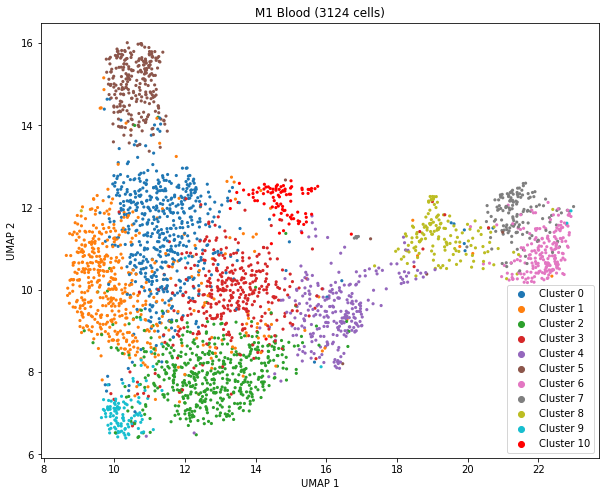

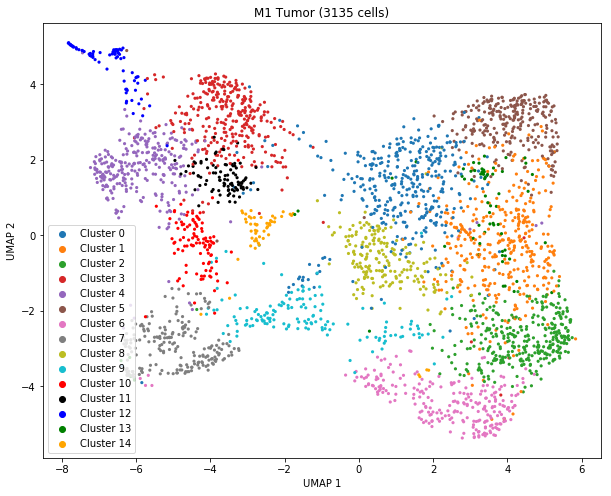

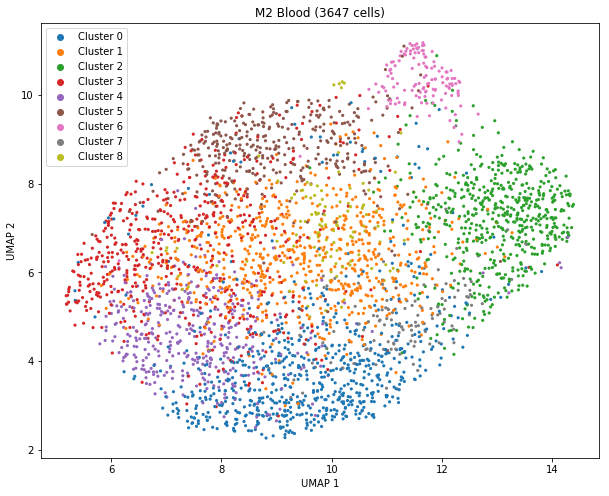

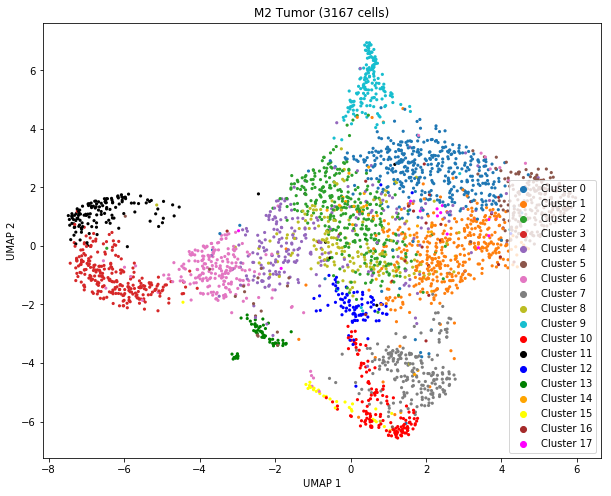

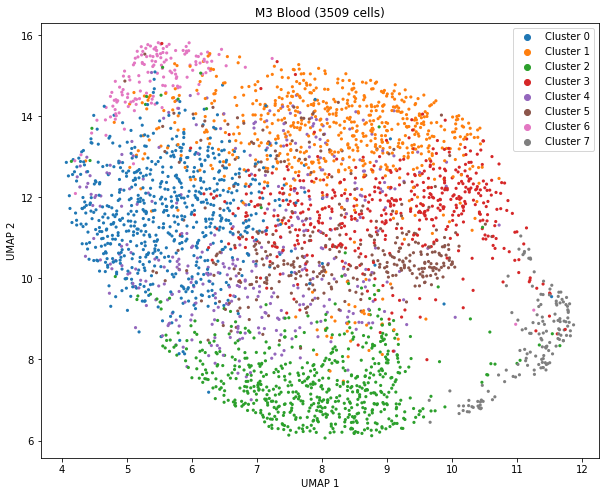

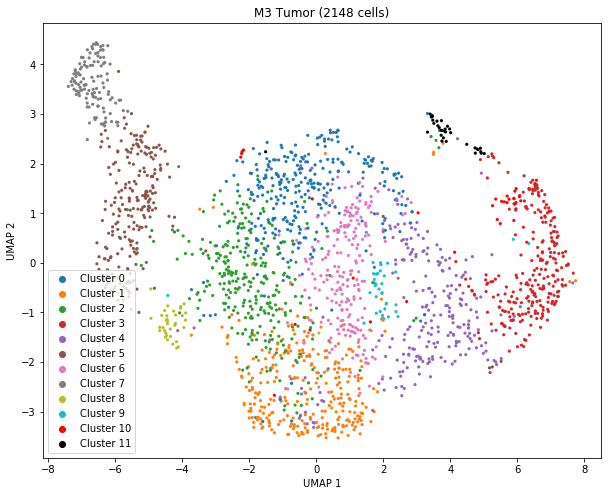

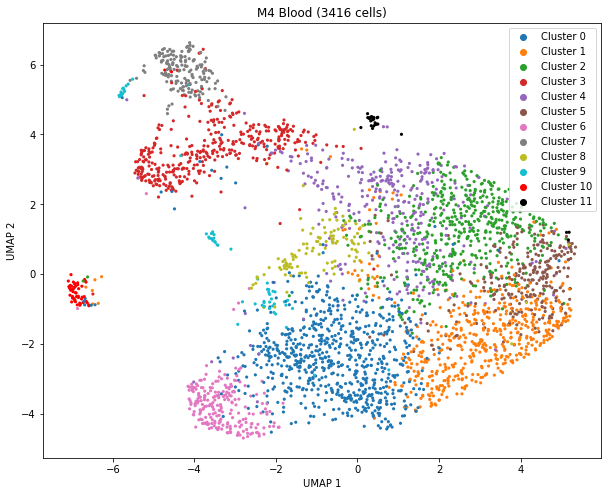

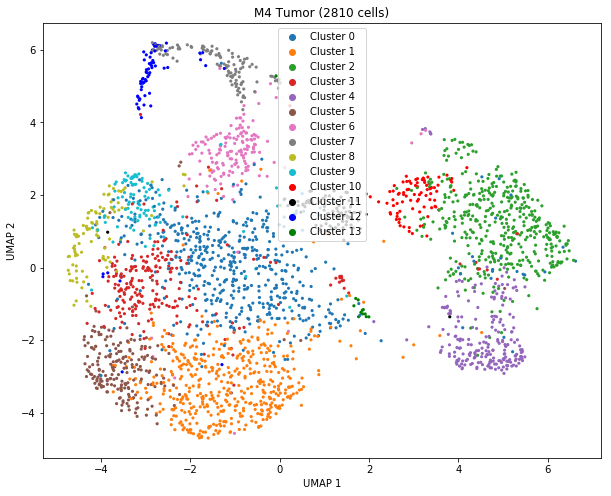

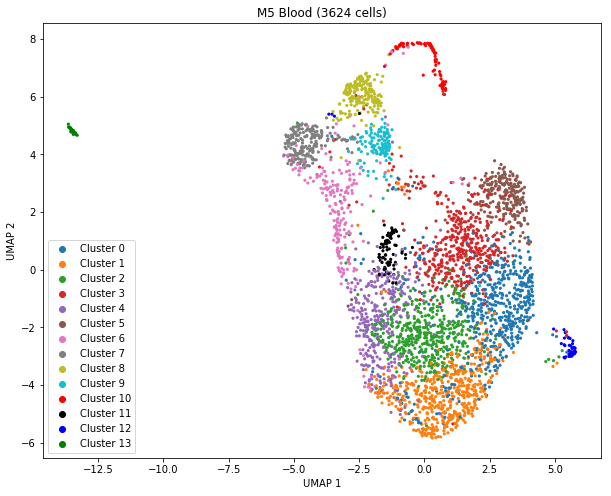

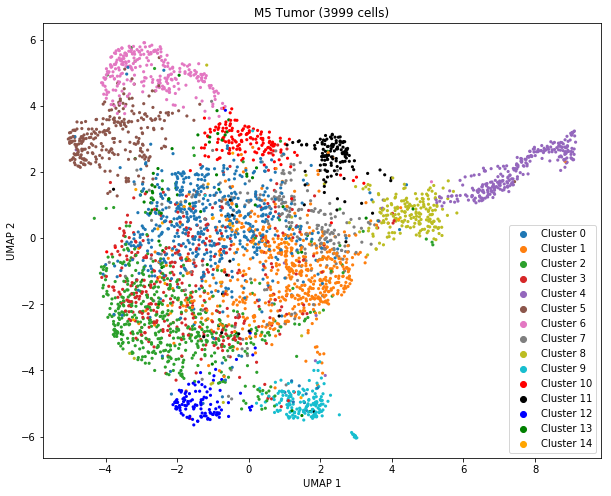

In [34]:
for i,sample in enumerate(samples):

    PlotUMAPs(Blood_meta[i], "{} Blood".format(sample))
    PlotUMAPs(Tumor_meta[i], "{} Tumor".format(sample))

# Plot the UMAPs of the integrated objects

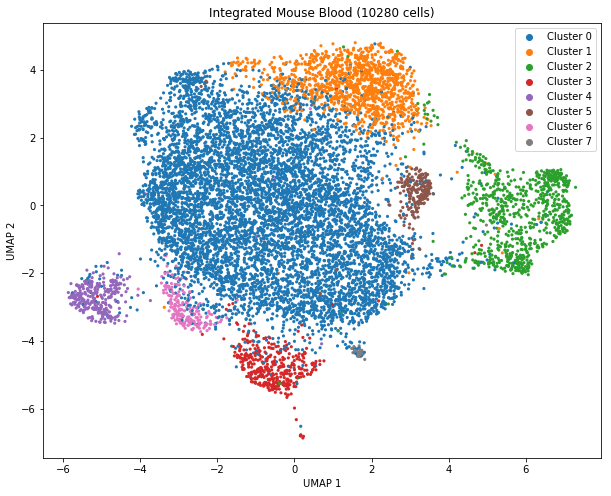

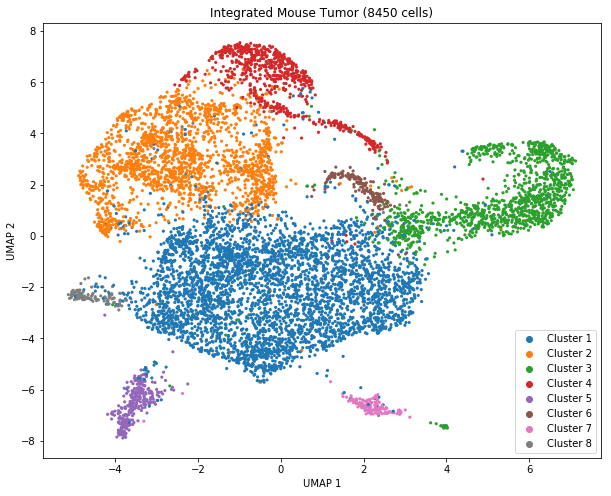

In [35]:
PlotUMAPs(MouseIntBlood_meta, "Integrated Mouse Blood")
PlotUMAPs(MouseIntTumor_meta, "Integrated Mouse Tumor")
plt.show()

### Plot Specific Genes on UMAP (Individual Blood Samples)

M1_Blood


... storing 'Sample' as categorical
... storing 'Matching' as categorical
... storing 'TCR' as categorical
... storing 'Matching_pre_filter' as categorical


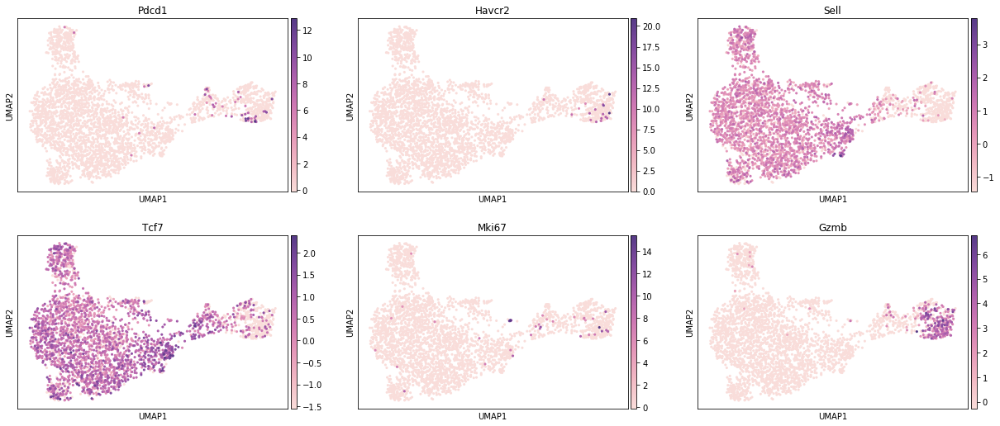

M2_Blood


... storing 'Sample' as categorical
... storing 'Matching' as categorical
... storing 'TCR' as categorical
... storing 'Matching_pre_filter' as categorical


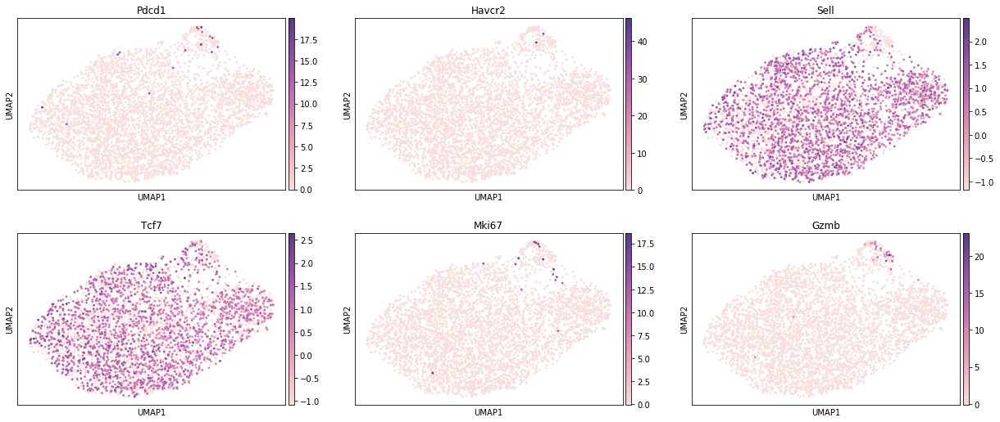

M3_Blood


... storing 'Sample' as categorical
... storing 'Matching' as categorical
... storing 'TCR' as categorical
... storing 'Matching_pre_filter' as categorical


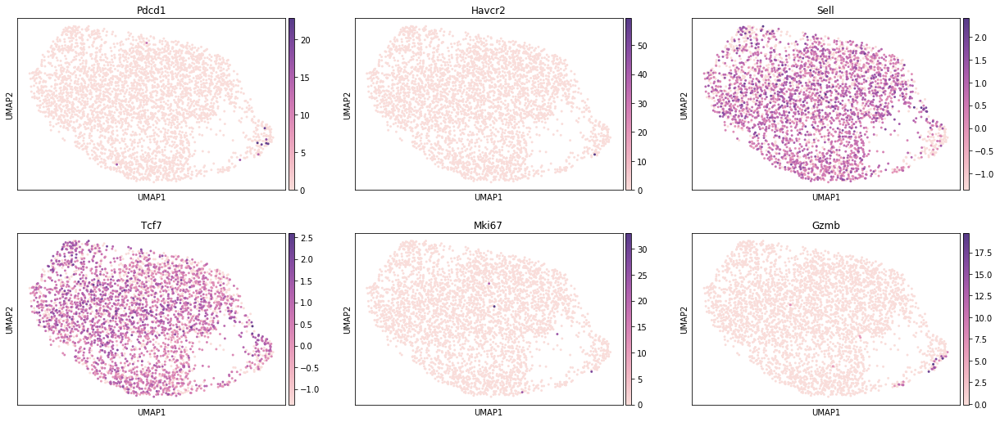

M4_Blood


... storing 'Sample' as categorical
... storing 'Matching' as categorical
... storing 'TCR' as categorical
... storing 'Matching_pre_filter' as categorical


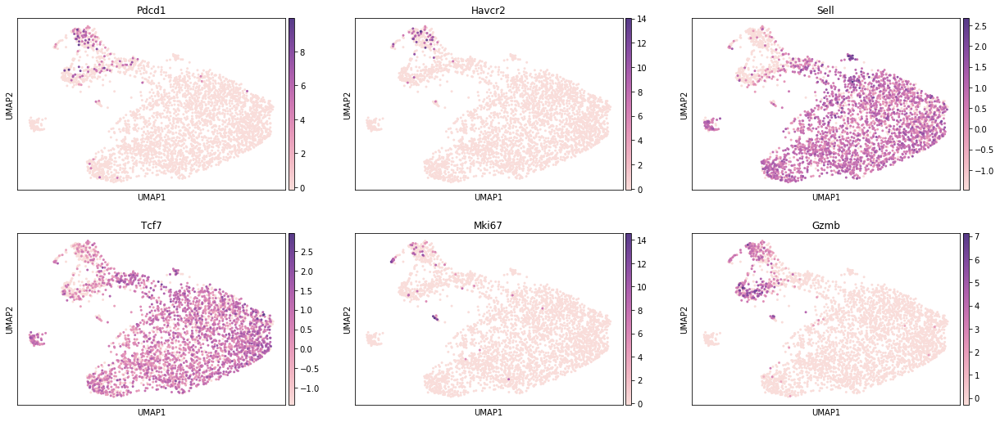

M5_Blood


... storing 'Sample' as categorical
... storing 'Matching' as categorical
... storing 'TCR' as categorical
... storing 'Matching_pre_filter' as categorical


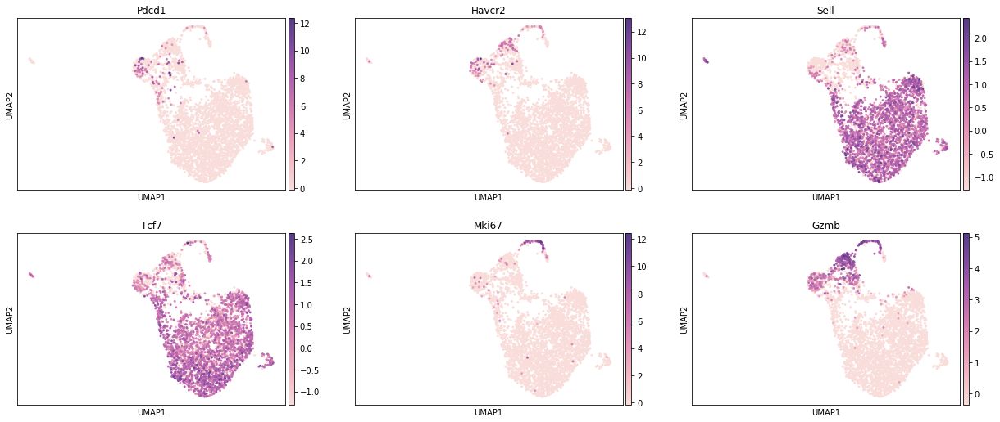

In [39]:
# Genes to plot
genes = ['Pdcd1', 'Havcr2', 'Sell', 'Tcf7', 'Mki67', 'Gzmb']

for i,sample in enumerate(samples):
    
    print(sample + '_Blood')
    
    Adata = df_to_adata(Blood_mtxs[i], Blood_meta[i])
    
    # Normalize
    sc.pp.normalize_per_cell(Adata, counts_per_cell_after=1e4)
    sc.pp.log1p(Adata)
    sc.pp.scale(Adata)
    
    sc.pl.umap(Adata, color = genes, ncols = 3, color_map = PurpOr_7.mpl_colormap)

### Plot Specific Genes on UMAP (Individual Tumor Samples)

M1_Tumor


... storing 'Sample' as categorical
... storing 'Matching' as categorical
... storing 'TCR' as categorical
... storing 'Matching_pre_filter' as categorical


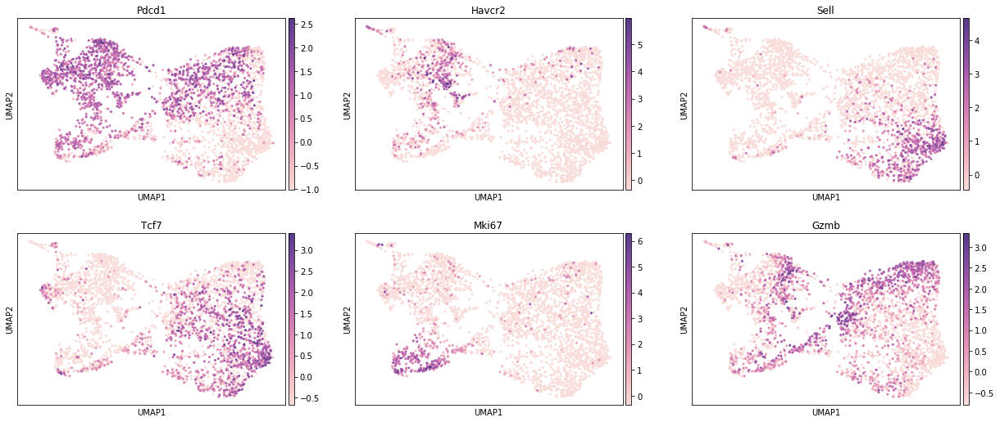

M2_Tumor


... storing 'Sample' as categorical
... storing 'Matching' as categorical
... storing 'TCR' as categorical
... storing 'Matching_pre_filter' as categorical


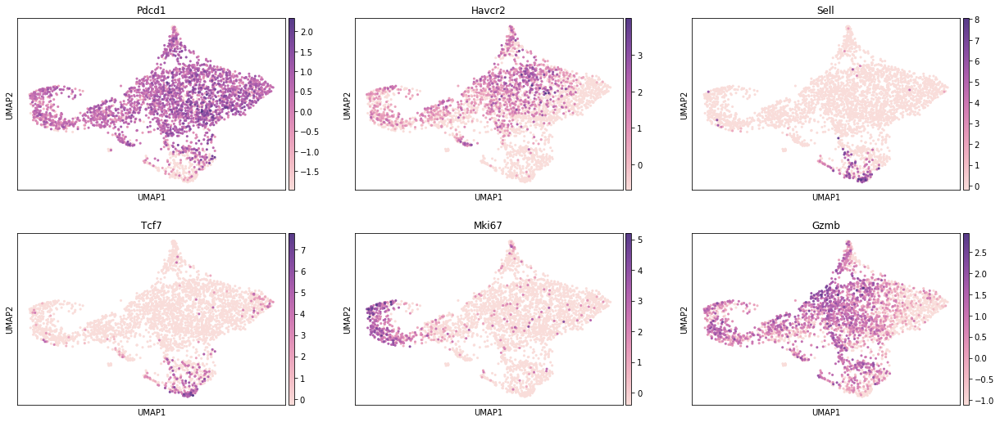

M3_Tumor


... storing 'Sample' as categorical
... storing 'Matching' as categorical
... storing 'TCR' as categorical
... storing 'Matching_pre_filter' as categorical


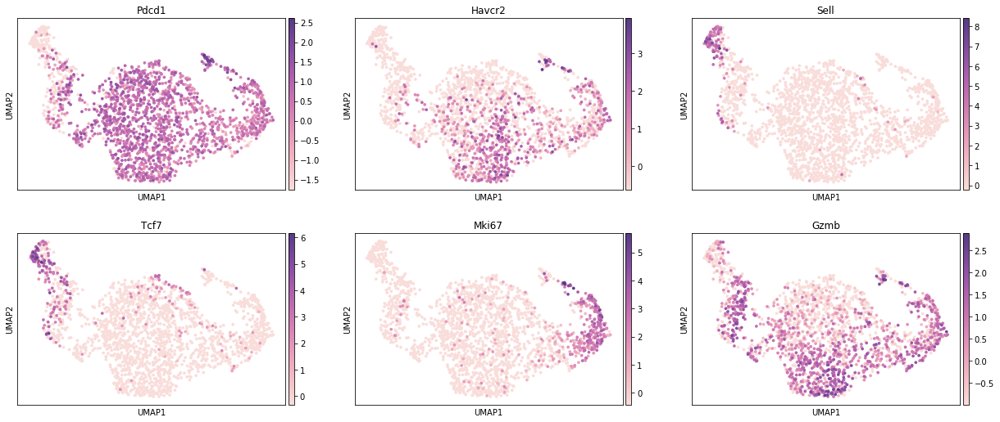

M4_Tumor


... storing 'Sample' as categorical
... storing 'Matching' as categorical
... storing 'TCR' as categorical
... storing 'Matching_pre_filter' as categorical


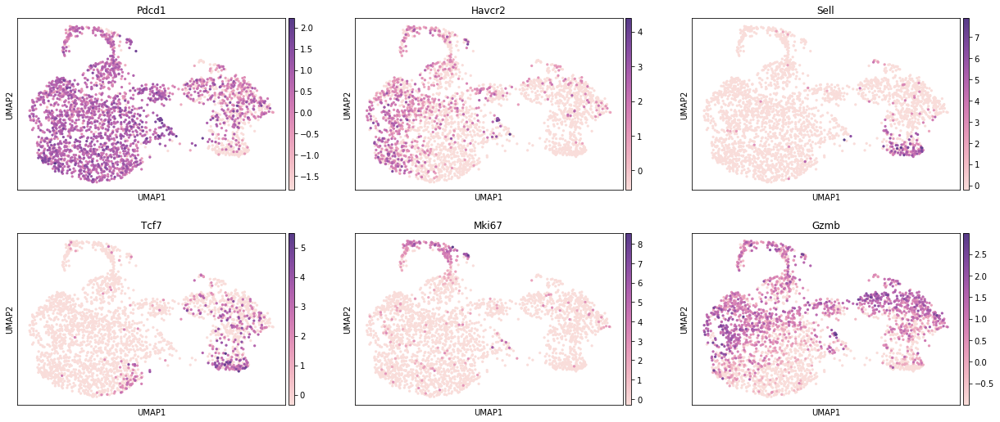

M5_Tumor


... storing 'Sample' as categorical
... storing 'Matching' as categorical
... storing 'TCR' as categorical
... storing 'Matching_pre_filter' as categorical


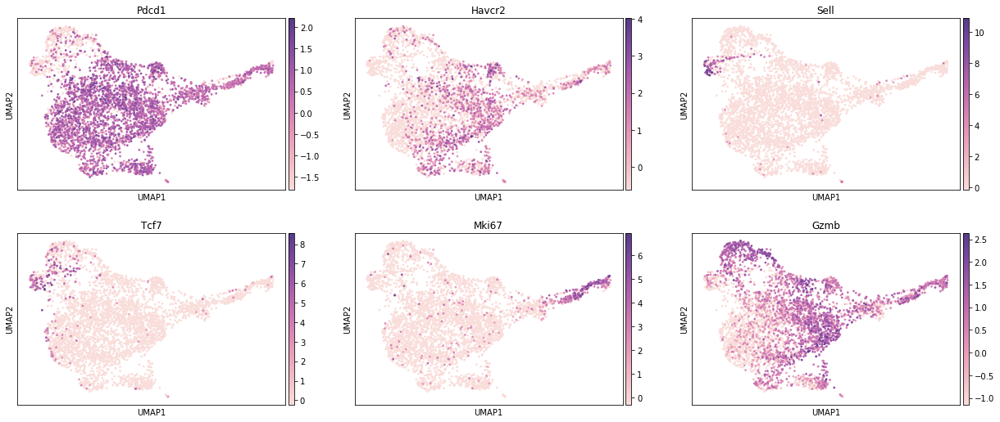

In [40]:
# Genes to plot
genes = ['Pdcd1', 'Havcr2', 'Sell', 'Tcf7', 'Mki67', 'Gzmb']

for i,sample in enumerate(samples):
    
    print(sample + '_Tumor')
    
    Adata = df_to_adata(Tumor_mtxs[i], Tumor_meta[i])
    
    # Normalize
    sc.pp.normalize_per_cell(Adata, counts_per_cell_after=1e4)
    sc.pp.log1p(Adata)
    sc.pp.scale(Adata)
    
    sc.pl.umap(Adata, color = genes, ncols = 3, color_map = PurpOr_7.mpl_colormap)

### Plot Specific Genes on UMAP (Integrated Samples)

Integrated Mouse Blood


... storing 'Matching' as categorical
... storing 'Sample' as categorical
... storing 'TCR' as categorical
... storing 'Matching_pre_filter' as categorical


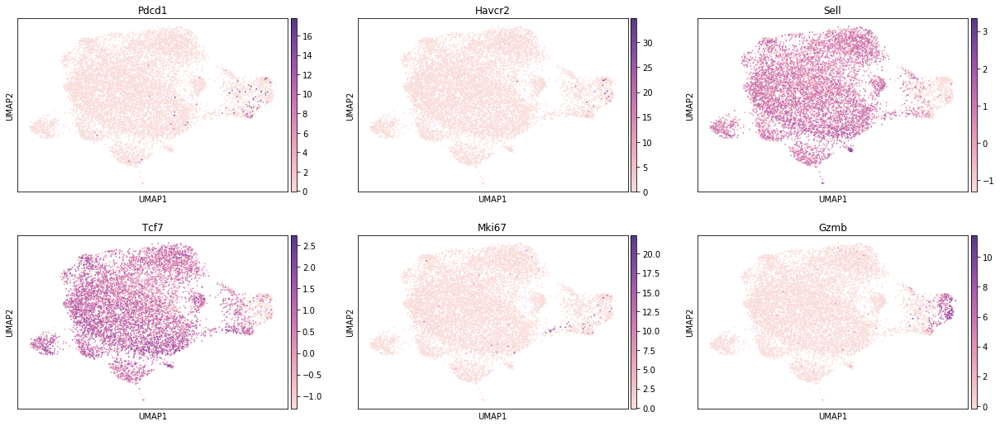

Integrated Mouse Tumor


... storing 'Matching' as categorical
... storing 'Sample' as categorical
... storing 'TCR' as categorical
... storing 'Matching_pre_filter' as categorical


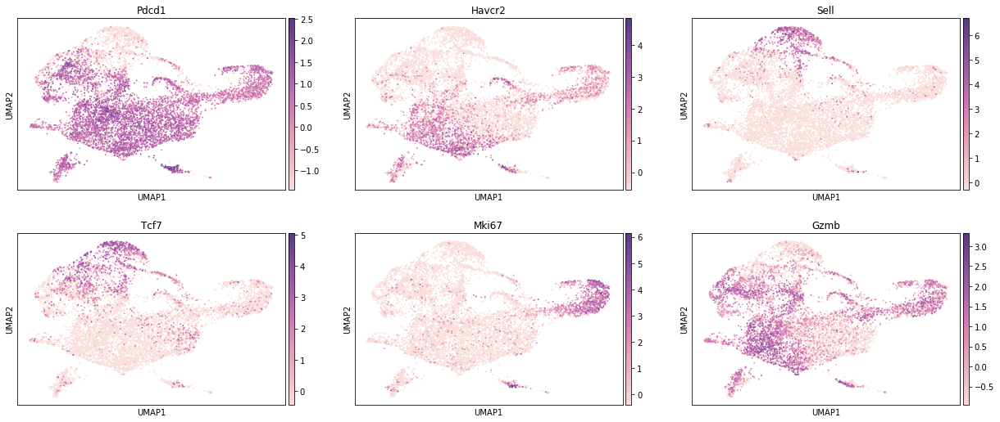

In [43]:
# Genes to plot
genes = ['Pdcd1', 'Havcr2', 'Sell', 'Tcf7', 'Mki67', 'Gzmb']

# Default folder to save figures in
sc.settings.figdir = 'Figures/'

# File format
sc.settings.file_format_figs = "pdf"

mtxs = [MouseIntBlood_mtxs,MouseIntTumor_mtxs]
metas = [MouseIntBlood_meta, MouseIntTumor_meta]
names = ['Integrated Mouse Blood', 'Integrated Mouse Tumor']

for mtx,meta,sample in zip(mtxs, metas, names):
    
    print(sample)
    
    Adata = df_to_adata(mtx, meta)
    
    # Normalize
    sc.pp.normalize_per_cell(Adata, counts_per_cell_after=1e4)
    sc.pp.log1p(Adata)
    sc.pp.scale(Adata)
    
    # File names
    if sample == 'Integrated Mouse Blood':
        save_name = 'SuppFig1E_MouseIntBlood_markers.pdf'
    if sample == 'Integrated Mouse Tumor':
        save_name = 'SuppFig1F_MouseIntTumor_markers.pdf'
    
    sc.pl.umap(Adata, color = genes, ncols = 3, color_map = PurpOr_7.mpl_colormap, save = save_name)

# Create function to make expansion plots

In [44]:
def ExpansionPlot(df, title):
    
    LargestClone = max(df['Clone.size'])                   # Find the largest clone size

    purples = cm.get_cmap('Purples', LargestClone)         # Choose the colormap with 256 elements
    newcolors = purples(np.linspace(0, 1, LargestClone))   # Evenly spaced numbers between 0 and 1
    black = np.array([0/256, 0/256, 0/256, 1])             # Define the color black
    gray = np.array([192/256, 192/256, 192/256, 1])        # Define the color black
    newcolors[:1, :] = black                               # Clone sizes of 0 are colored black
    newcolors[1:2, :] = gray                               # Clone sizes of 1 are gray
    newcmp = ListedColormap(newcolors)                     # Combine these as a new colormap



    plt.figure(figsize=(10,8))                                          # Size of each figure
    plt.xlabel("UMAP 1")                                                # Label x-axis
    plt.ylabel("UMAP 2")                                                # Label y-axis

    # Scatterplot for all cells, colored by T cell expansion    
    plt.scatter(df['UMAP_1'], df['UMAP_2'], c = df['Clone.size'], s=2, cmap=plt.cm.get_cmap(newcmp),
               edgecolor = None)

    plt.gca().spines['right'].set_visible(False)                        # Remove spine from right side of figure
    plt.gca().spines['top'].set_visible(False)                          # Remove spine from top side of figure

    plt.title(title + " ({} cells)\nBlack = Not a Clone, Gray = Clone Size of 1".format(len(df)))   # Add title
    plt.colorbar()

    plt.show()                                                          # Show the figure

# Make Expansion Plots

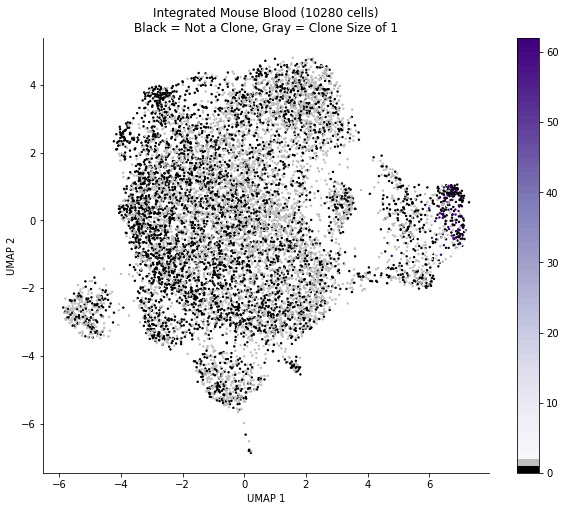

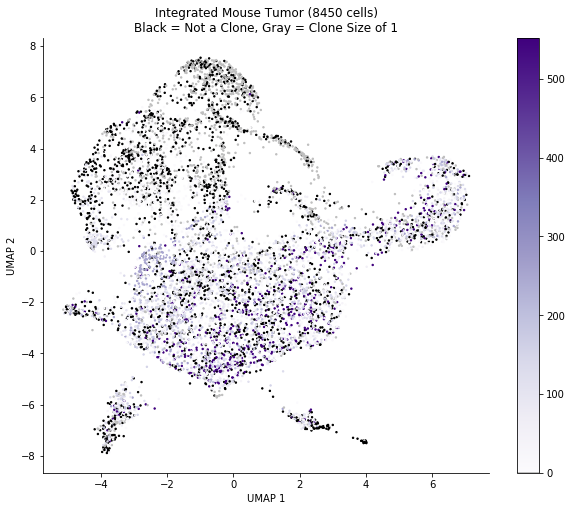

In [45]:
ExpansionPlot(MouseIntBlood_meta, 'Integrated Mouse Blood')
ExpansionPlot(MouseIntTumor_meta, 'Integrated Mouse Tumor')

# Create a function to make expansion plots (log10 transform)

In [50]:
def ExpansionPlotLog10(df, title, save = None):
    
    df1 = df.copy()
    
    df1 = df1[df1['TCR'] != 'notcr']
    df1 = df1[df1['Clone.size'] != 0]
    
    CS = list(df1['Clone.size'])
    logCS = np.log10(CS)

    df1['Clone.size'] = logCS

    #df1 = df1[df1['Clone size'] >= 0]

    LargestClone = len(np.unique(df1['Clone.size']))       # Find the largest clone size

    purples = cm.get_cmap('Purples', LargestClone)         # Choose the colormap with 256 elements
    newcolors = purples(np.linspace(0, 1, LargestClone))   # Evenly spaced numbers between 0 and 1
    gray = np.array([192/256, 192/256, 192/256, 1])        # Define the color black
    newcolors[:1, :] = gray                                # Clone sizes of 1 are gray
    newcmp = ListedColormap(newcolors)                     # Combine these as a new colormap



    plt.figure(figsize=(10,8))                                          # Size of each figure
    plt.xlabel("UMAP 1")                                                # Label x-axis
    plt.ylabel("UMAP 2")                                                # Label y-axis

    # Scatterplot for all cells, colored by T cell expansion    
    plt.scatter(df1['UMAP_1'], df1['UMAP_2'], c = df1['Clone.size'], s=2, cmap=plt.cm.get_cmap(newcmp),
               edgecolor = None)

    plt.gca().spines['right'].set_visible(False)                        # Remove spine from right side of figure
    plt.gca().spines['top'].set_visible(False)                          # Remove spine from top side of figure

    plt.title(title + " ({} cells, log10 transform)\nGray = Clone Size of 1".format(len(df1)))       # Add title
    plt.colorbar()
    
    if save is True:
        if sample == 'Integrated Mouse Blood':
            plt.savefig("Figures/Fig1G_MouseIntBlood_Expansion_log10.pdf")
            
        if sample == 'Integrated Mouse Tumor':
            plt.savefig("Figures/Fig3C_MouseIntTumor_Expansion_log10.pdf")
    

    plt.show()                                                          # Show the figure

# Make Expansion Plots (log10 transform)

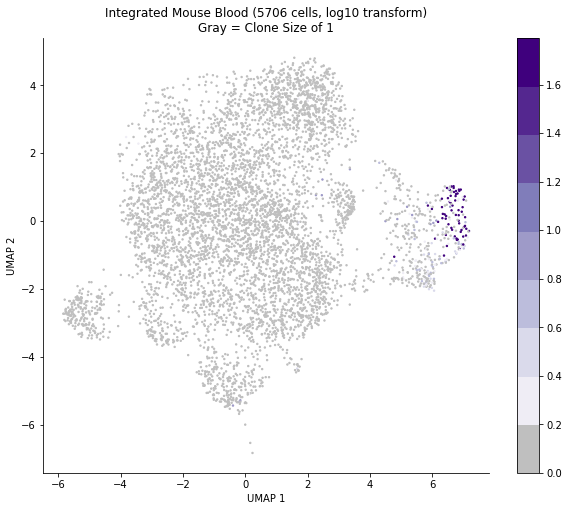

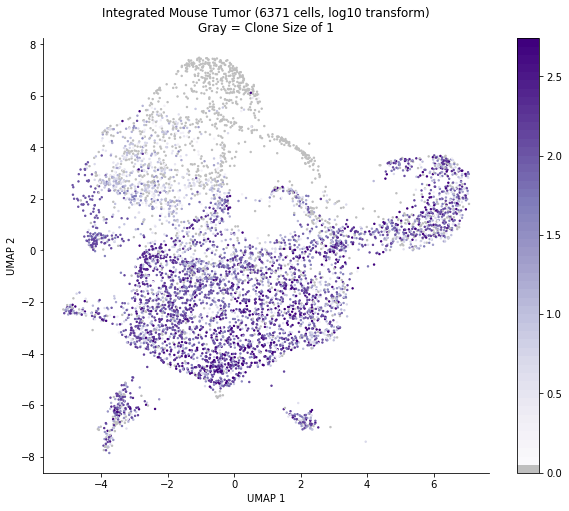

In [51]:
ExpansionPlotLog10(MouseIntBlood_meta, 'Integrated Mouse Blood', save = True)
ExpansionPlotLog10(MouseIntTumor_meta, 'Integrated Mouse Tumor', save = True)

# Count number and percent of matching cells (blood)

In [57]:
for i,sample in enumerate(samples):
    
    df = AB_Clones(Blood_meta[i])
    
    mtx = df[ df['Matching'] == 'matching' ].copy()               # All cells that are matching
    len_matching = len(mtx)                                       # Number of matching cells
    perc_matching = len(mtx)/len(df) * 100                        # Percent of matching cells
    
    print("For {}, there are {} matching cells, which are {:1.2f}% of cells.".format(sample,len_matching,perc_matching))

For M1, there are 183 matching cells, which are 10.08% of cells.
For M2, there are 22 matching cells, which are 1.22% of cells.
For M3, there are 28 matching cells, which are 1.34% of cells.
For M4, there are 277 matching cells, which are 11.44% of cells.
For M5, there are 344 matching cells, which are 13.07% of cells.


# Count number and percent of matching cells (tumor)

In [58]:
for i,sample in enumerate(samples):
    
    df = AB_Clones(Tumor_meta[i])
    
    mtx = df[ df['Matching'] == 'matching' ].copy()               # All cells that are matching
    len_matching = len(mtx)                                       # Number of matching cells
    perc_matching = len(mtx)/len(df) * 100                        # Percent of matching cells
    
    print("For {}, there are {} matching cells, which are {:1.2f}% of cells.".format(sample,len_matching,perc_matching))

For M1, there are 752 matching cells, which are 34.42% of cells.
For M2, there are 1144 matching cells, which are 47.53% of cells.
For M3, there are 239 matching cells, which are 13.43% of cells.
For M4, there are 1640 matching cells, which are 69.70% of cells.
For M5, there are 2267 matching cells, which are 75.72% of cells.


# Plot Integrated UMAPs by Matching condition

In [67]:
def MatchingUMAP(df, title, save = False):
    
    Colors = list(plt.rcParams['axes.prop_cycle'].by_key()['color'])
    Colors.insert(0,'#DCDCDC')
    
    df_AB = AB_Clones(df)

    fig, ax = plt.subplots(figsize=(10,8))                              # Size of each figure

    scatter_colors = Colors[0:len(df_AB['Matching'].unique())]
    
    # Scatterplot for all cells, colored by matching condition    
    sns.scatterplot(data = df_AB, x = 'UMAP_1', y = 'UMAP_2', linewidth=0,
                   hue = 'Matching', ax=ax, s=5, palette = scatter_colors)

    plt.gca().spines['right'].set_visible(False)                        # Remove spine from right side of figure
    plt.gca().spines['top'].set_visible(False)                          # Remove spine from top side of figure

    plt.title(title + " ({} cells)".format(len(df_AB)))                    # Add title
    
    m = ['M1_matching', 'M2_matching', 'M3_matching']
    
    new_labels = []
        
    for i,sample in enumerate(samples[:3]):  
        
        n_matching = len(df[ df['Matching'] == m[i] ])
        perc_matching = n_matching/len(df) * 100
        new_labels.append("{} Matching\n({} cells, {:1.2f}% matching)".format(sample,n_matching,perc_matching))

    new_labels.append('Not Matching')
        
    handles, labels = ax.get_legend_handles_labels()
    ax.legend(handles=handles[1:], labels=new_labels)
    
    plt.setp(ax.get_legend().get_texts(), fontsize='8')                 # For legend text
    ax.set_xlabel("UMAP 1")                                             # Label x-axis
    ax.set_ylabel("UMAP 2")                                             # Label y-axis

    if save is True:
        plt.savefig("Figures/Fig1D_MouseIntBlood_matching.pdf")
    

    plt.show()                                                          # Show the figure

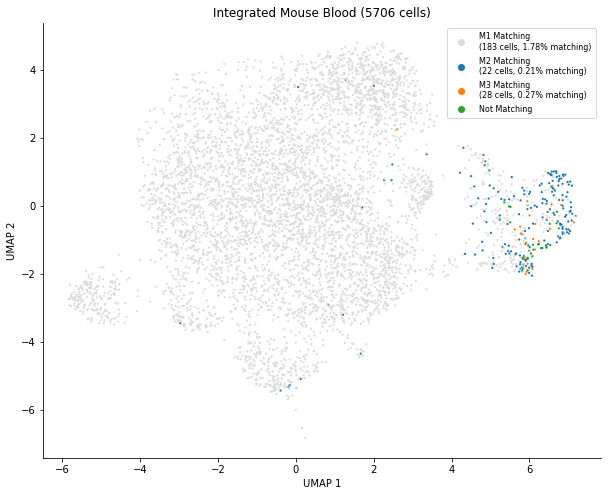

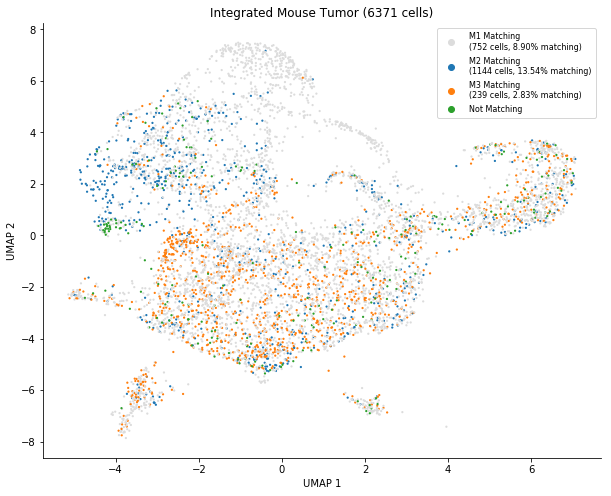

In [68]:
MatchingUMAP(MouseIntBlood_meta, 'Integrated Mouse Blood', save = True)
MatchingUMAP(MouseIntTumor_meta, 'Integrated Mouse Tumor')

# Plot Integrated UMAPs by Mouse Sample (Supplemental Figure 1C)

### Integrated Blood

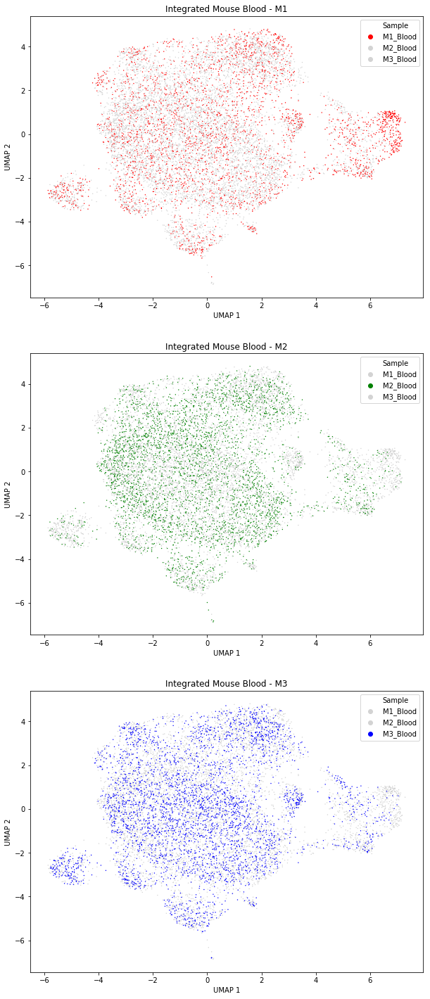

In [69]:
# Make three figures, one in each row
fig, ax = plt.subplots(nrows = 3, figsize = (10,25))



sns.scatterplot(x = 'UMAP_1', y = 'UMAP_2', data = MouseIntBlood_meta, hue = 'Sample',
                palette = ['red','lightgray','lightgray'], ax = ax[0], linewidth = 0, s = 2)

sns.scatterplot(x = 'UMAP_1', y = 'UMAP_2', data = MouseIntBlood_meta, hue = 'Sample',
                palette = ['lightgray','green','lightgray'], ax = ax[1], linewidth = 0, s = 2)

sns.scatterplot(x = 'UMAP_1', y = 'UMAP_2', data = MouseIntBlood_meta, hue = 'Sample',
                palette = ['lightgray','lightgray','blue'], ax = ax[2], linewidth = 0, s = 2)

ax[0].set_title('Integrated Mouse Blood - M1')
ax[1].set_title('Integrated Mouse Blood - M2')
ax[2].set_title('Integrated Mouse Blood - M3')

for axes in ax.flat:
    axes.set_xlabel('UMAP 1')
    axes.set_ylabel('UMAP 2')

plt.savefig('Figures/SuppFig1C_MouseIntBlood_bysample.pdf')

plt.show()

### Integrated Tumor

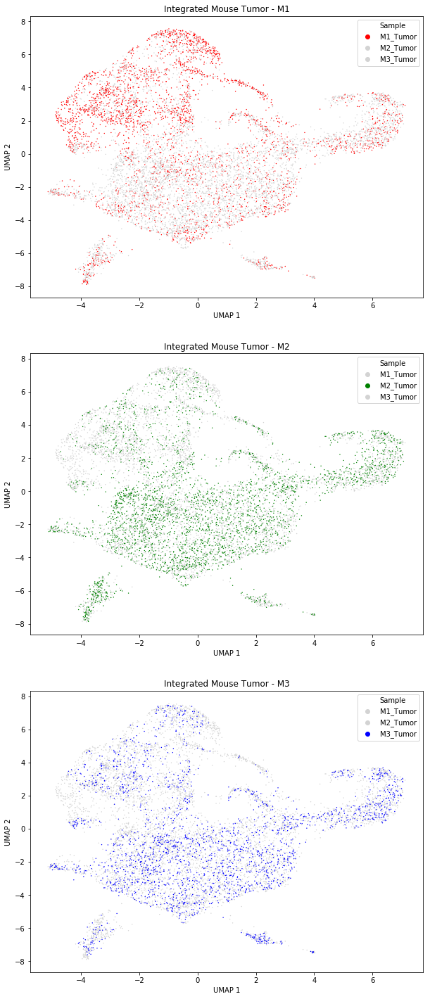

In [70]:
# Make three figures, one in each row
fig, ax = plt.subplots(nrows = 3, figsize = (10,25))



sns.scatterplot(x = 'UMAP_1', y = 'UMAP_2', data = MouseIntTumor_meta, hue = 'Sample',
                palette = ['red','lightgray','lightgray'], ax = ax[0], linewidth = 0, s = 2)

sns.scatterplot(x = 'UMAP_1', y = 'UMAP_2', data = MouseIntTumor_meta, hue = 'Sample',
                palette = ['lightgray','green','lightgray'], ax = ax[1], linewidth = 0, s = 2)

sns.scatterplot(x = 'UMAP_1', y = 'UMAP_2', data = MouseIntTumor_meta, hue = 'Sample',
                palette = ['lightgray','lightgray','blue'], ax = ax[2], linewidth = 0, s = 2)

ax[0].set_title('Integrated Mouse Tumor - M1')
ax[1].set_title('Integrated Mouse Tumor - M2')
ax[2].set_title('Integrated Mouse Tumor - M3')

for axes in ax.flat:
    axes.set_xlabel('UMAP 1')
    axes.set_ylabel('UMAP 2')

plt.savefig('Figures/SuppFig1C_MouseIntTumor_bysample.pdf')

plt.show()

# Plot Integrated UMAPs by Matching Conditions (Figure 3A and Supplemental Figure 1D)

### Integrated Blood

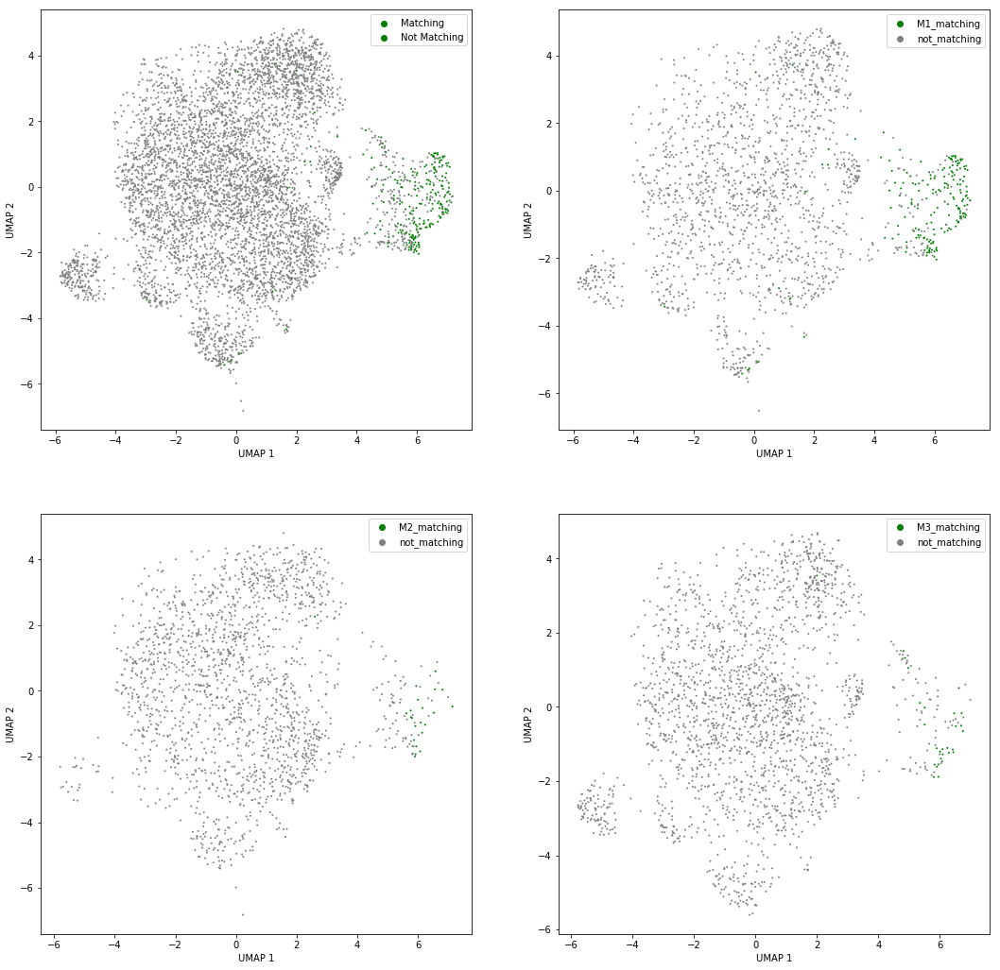

In [74]:
# Make three figures, one in each row
fig, axes = plt.subplots(nrows = 2, ncols = 2, figsize = (18,18))

df = AB_Clones(MouseIntBlood_meta)


sns.scatterplot(x = 'UMAP_1', y = 'UMAP_2', data = df, hue = 'Matching',
                palette = ['gray','green','green','green'], ax = axes[0,0], linewidth = 0, s = 4)

plotting = df[ df['Sample'] == 'M1_Blood' ]
order = ['M1_matching','not_matching']
sns.scatterplot(x = 'UMAP_1', y = 'UMAP_2', data = plotting, hue = 'Matching', hue_order = order,
                palette = ['green','gray'], ax = axes[0,1], linewidth = 0, s = 4)

plotting = df[ df['Sample'] == 'M2_Blood' ]
order = ['M2_matching','not_matching']
sns.scatterplot(x = 'UMAP_1', y = 'UMAP_2', data = plotting, hue = 'Matching', hue_order = order,
                palette = ['green','gray'], ax = axes[1,0], linewidth = 0, s = 4)

plotting = df[ df['Sample'] == 'M3_Blood' ]
order = ['M3_matching','not_matching']
sns.scatterplot(x = 'UMAP_1', y = 'UMAP_2', data = plotting, hue = 'Matching', hue_order = order,
                palette = ['green','gray'], ax = axes[1,1], linewidth = 0, s = 4)

for i,ax in enumerate(axes.flat):
    ax.set_xlabel('UMAP 1')
    ax.set_ylabel('UMAP 2')
    handles, labels = ax.get_legend_handles_labels()
    
    # Special case: for top-left plot, keep matching binary (matching vs. not matching) only
    if i == 0:
        labels = ['Matching', 'Not Matching']
        handles = handles[-2:]
    else:
        labels = labels[1:]
        handles = handles[1:]
    
    ax.legend(handles=handles, labels=labels)
    


plt.savefig('Figures/SuppFig1D_MouseIntBlood_matching.pdf')

### Integrated Tumor

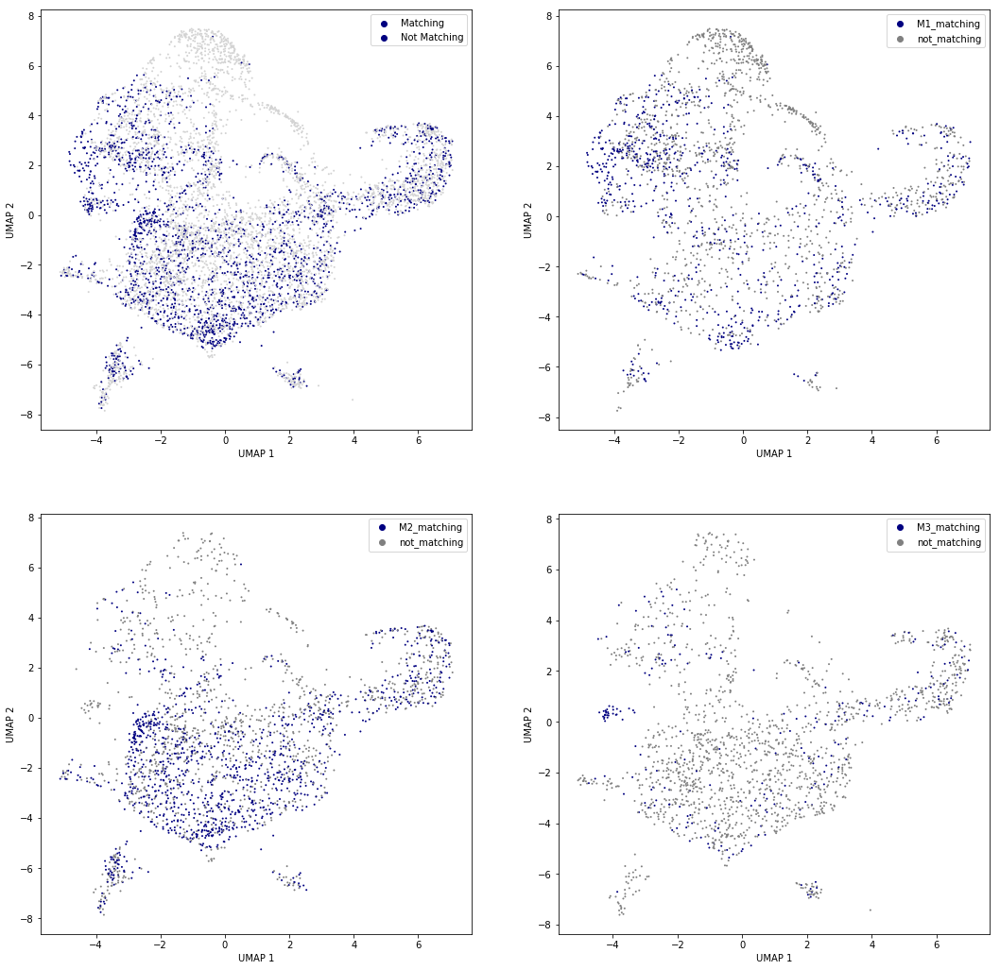

In [79]:
# Make three figures, one in each row
fig, axes = plt.subplots(nrows = 2, ncols = 2, figsize = (18,18))

df = AB_Clones(MouseIntTumor_meta)


sns.scatterplot(x = 'UMAP_1', y = 'UMAP_2', data = df, hue = 'Matching',
                palette = ['lightgray', 'navy','navy','navy'], ax = axes[0,0], linewidth = 0, s = 4)

plotting = df[ df['Sample'] == 'M1_Tumor' ]
order = ['M1_matching','not_matching']
sns.scatterplot(x = 'UMAP_1', y = 'UMAP_2', data = plotting, hue = 'Matching', hue_order = order,
                palette = ['navy','gray'], ax = axes[0,1], linewidth = 0, s = 4)

plotting = df[ df['Sample'] == 'M2_Tumor' ]
order = ['M2_matching','not_matching']
sns.scatterplot(x = 'UMAP_1', y = 'UMAP_2', data = plotting, hue = 'Matching', hue_order = order,
                palette = ['navy','gray'], ax = axes[1,0], linewidth = 0, s = 4)

plotting = df[ df['Sample'] == 'M3_Tumor' ]
order = ['M3_matching','not_matching']
sns.scatterplot(x = 'UMAP_1', y = 'UMAP_2', data = plotting, hue = 'Matching', hue_order = order,
                palette = ['navy','gray'], ax = axes[1,1], linewidth = 0, s = 4)

for i,ax in enumerate(axes.flat):
    ax.set_xlabel('UMAP 1')
    ax.set_ylabel('UMAP 2')
    handles, labels = ax.get_legend_handles_labels()
    
    # Special case: for top-left plot, keep matching binary (matching vs. not matching) only
    if i == 0:
        labels = ['Matching', 'Not Matching']
        handles = handles[-2:]
    else:
        labels = labels[1:]
        handles = handles[1:]
    
    ax.legend(handles=handles, labels=labels)
    


#plt.savefig('Figures/SuppFig1D_MouseIntTumor_matching.pdf')

# Make Pie Charts

### Create Function

In [82]:
def MakePD1PieCharts(sample, meta, mtx):
    
    # Keep the metadata
    df = AB_Clones(meta).copy()
    
    # Separate matching and non-matching cells
    M = df[ df['Matching'] != 'not_matching' ].index
    nM = df[ df['Matching'] == 'not_matching' ].index
    
    # Call gene column for PD1, matching cells
    PD1 = mtx.loc[M, 'PDCD1']
    
    # Number of M cells that are PD1+
    matching_pd1P = np.count_nonzero(PD1)
    
    # Number of M cells that are PD1-
    matching_pd1N = len(PD1) - matching_pd1P
    
    # Call gene column for PD1, nM cells
    PD1 = mtx.loc[nM, 'PDCD1']
    
    # Number of TM cells that are PD1+
    not_matching_pd1P = np.count_nonzero(PD1)
    
    # Number of TM cells that are PD1-
    not_matching_pd1N = len(PD1) - not_matching_pd1P
    
    # Make pie charts
    colors = ['#ff9999','#66b3ff']
    fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(13, 4))

    # Pie chart, matching cells
    labels = ['PD1+\n({} cells)'.format(matching_pd1P), 'PD1-\n({} cells)'.format(matching_pd1N)]
    ax1.pie([matching_pd1P,matching_pd1N], labels=labels, shadow=True, autopct='%1.1f%%', colors = colors)
    ax1.axis('equal')
    ax1.set_title('Matching Cells ({} cells)'.format(len(M)))

    # Pie chart, non-matching cells
    labels = ['PD1+\n({} cells)'.format(not_matching_pd1P), 'PD1-\n({} cells)'.format(not_matching_pd1N)]
    ax2.pie([not_matching_pd1P,not_matching_pd1N], labels=labels, shadow=True, autopct='%1.1f%%',
           colors = colors)
    ax2.axis('equal')
    ax2.set_title('Non-Matching Cells ({} cells)'.format(len(nM)))
    
    fig.suptitle(sample + ' ({} cells)\n\n\n\n'.format(len(df)))
    
    return (ax1, ax2)

### Individual Samples

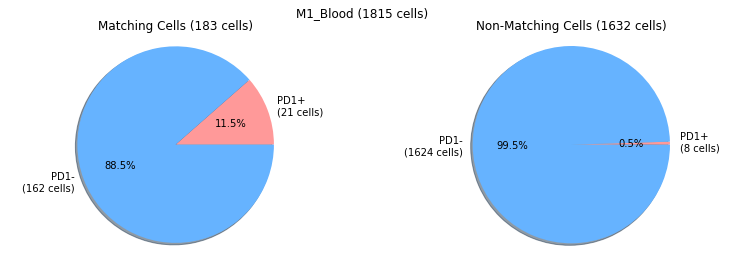

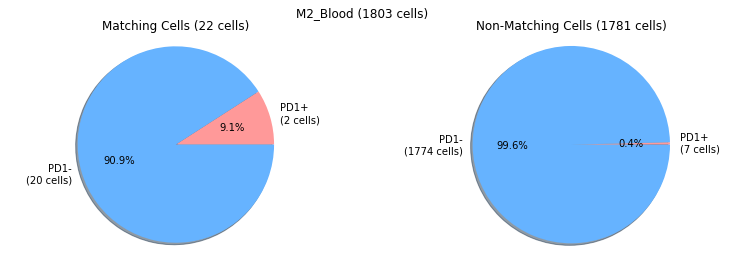

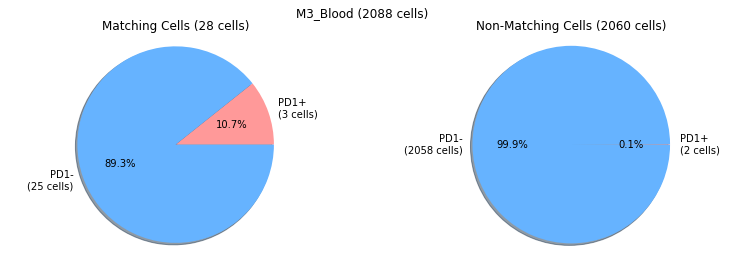

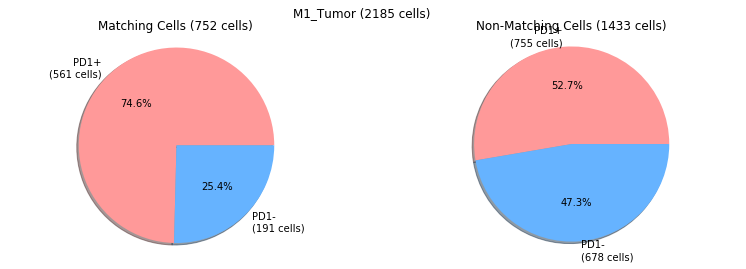

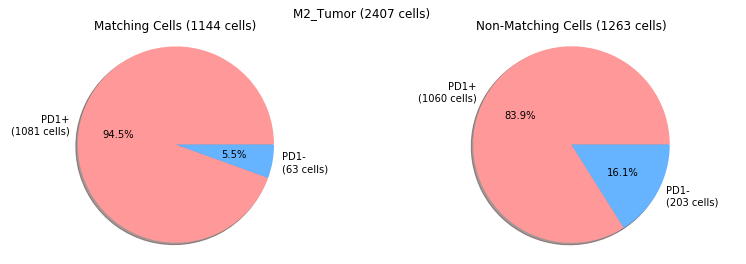

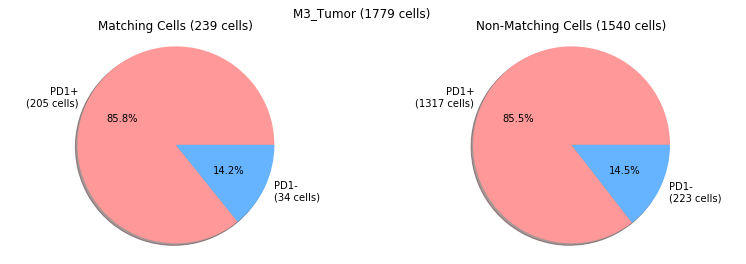

In [85]:
# Loop for blood samples
for i,sample in enumerate(samples[:3]):
    
    sample = sample + '_Blood'
    
    ax1, ax2 = MakePD1PieCharts(sample, Blood_meta[i], Blood_mtxs[i])
    plt.show()
    
# Loop for tumor samples
for i,sample in enumerate(samples[:3]):
    
    sample = sample + '_Tumor'
    
    ax1, ax2 = MakePD1PieCharts(sample, Tumor_meta[i], Tumor_mtxs[i])
    plt.show()

### Integrated Samples

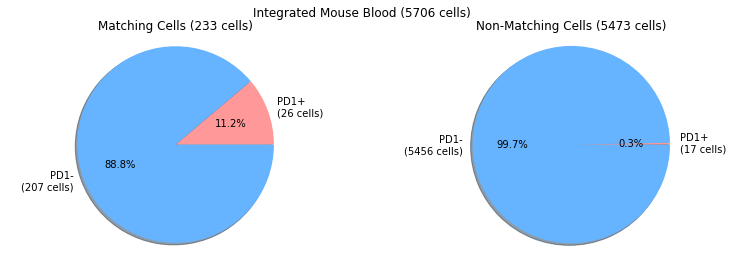

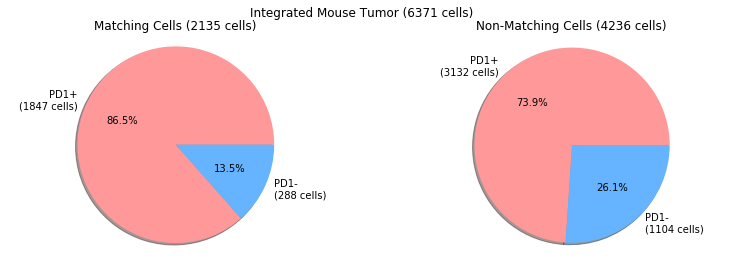

In [88]:
# Integrated Blood
ax1, ax2 = MakePD1PieCharts('Integrated Mouse Blood', MouseIntBlood_meta, MouseIntBlood_mtxs)
plt.savefig('Figures/Fig1H_MouseIntBlood_PD1piechart.pdf')

# Integrated Tumor
ax1, ax2 = MakePD1PieCharts('Integrated Mouse Tumor', MouseIntTumor_meta, MouseIntTumor_mtxs)

# UMAP of Gene Signatures

### Create Adata objects

In [99]:
Blood_adata = [0] * len(samples)
Tumor_adata = [0] * len(samples)

for i in range(len(samples[:3])):
    
    Blood_adata[i] = df_to_adata(Blood_mtxs[i] ,Blood_meta[i])
    Tumor_adata[i] = df_to_adata(Tumor_mtxs[i] ,Tumor_meta[i])

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [100]:
MouseIntBlood_adata = df_to_adata(MouseIntBlood_mtxs, MouseIntBlood_meta)
MouseIntTumor_adata = df_to_adata(MouseIntTumor_mtxs, MouseIntTumor_meta)

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


### Standard filters

In [101]:
sc.pp.normalize_per_cell(MouseIntBlood_adata, counts_per_cell_after=1e4)
sc.pp.normalize_per_cell(MouseIntTumor_adata, counts_per_cell_after=1e4)

sc.pp.log1p(MouseIntBlood_adata)
sc.pp.log1p(MouseIntTumor_adata)

sc.pp.scale(MouseIntBlood_adata)
sc.pp.scale(MouseIntTumor_adata)

In [102]:
for i,sample in enumerate(samples[:3]):
    
    sc.pp.normalize_per_cell(Blood_adata[i], counts_per_cell_after=1e4)
    sc.pp.log1p(Blood_adata[i])
    sc.pp.scale(Blood_adata[i])

### Make gene panels

In [93]:
# Define gene lists and names
gene_lists = [sarkar_activation, cellcycle, kaech_naive, TRM, bystander, progenitorexh, terminallyexh]
gene_names = ['Sarkar (Activation)', 'Cell Cycle', 'Kaech (Naive)', 'Tissue Resident Memory',
              'Bystander', 'Progenitor Exhausted', 'Terminally Exhausted']

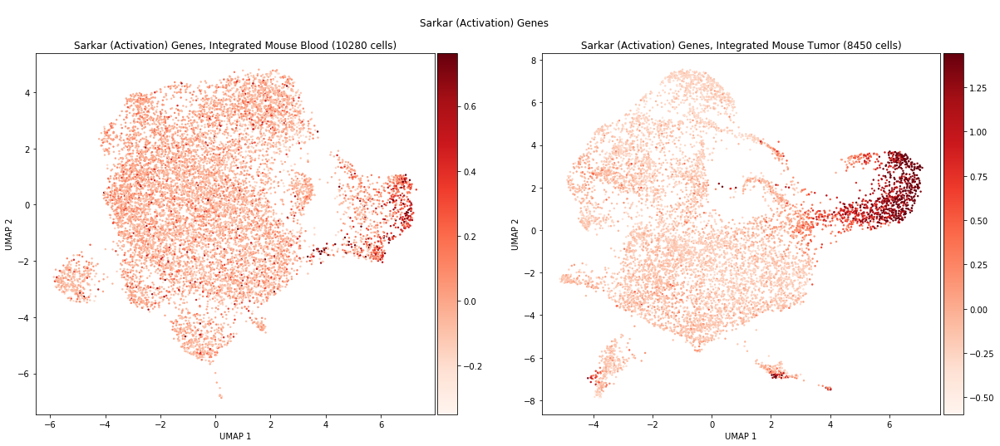

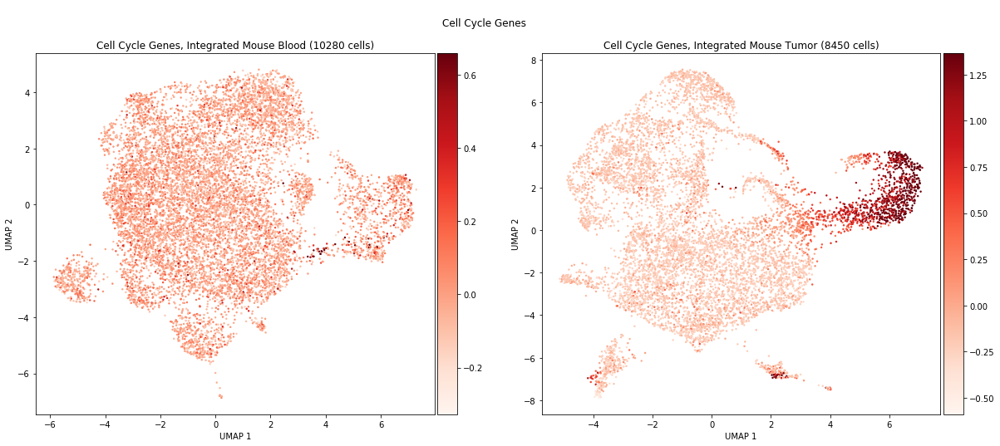

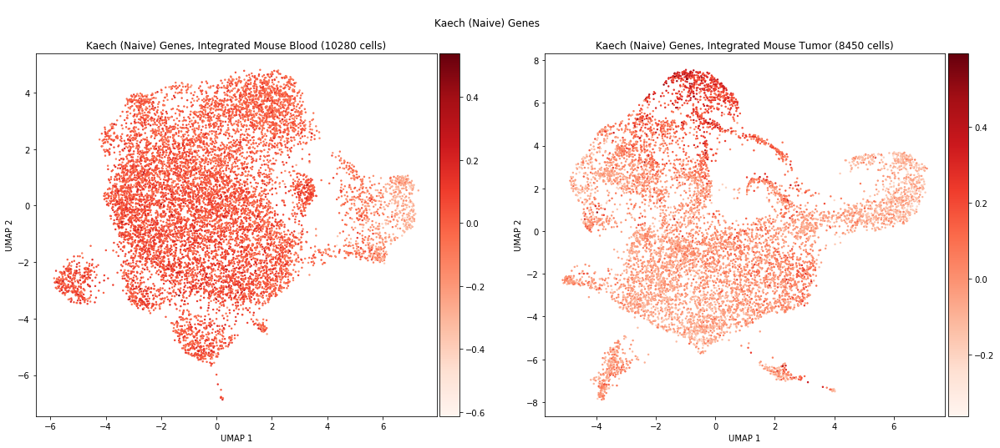

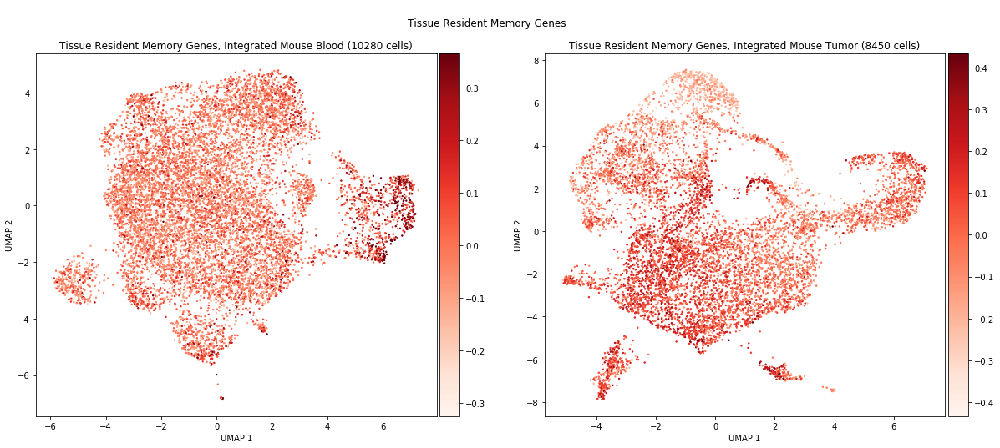

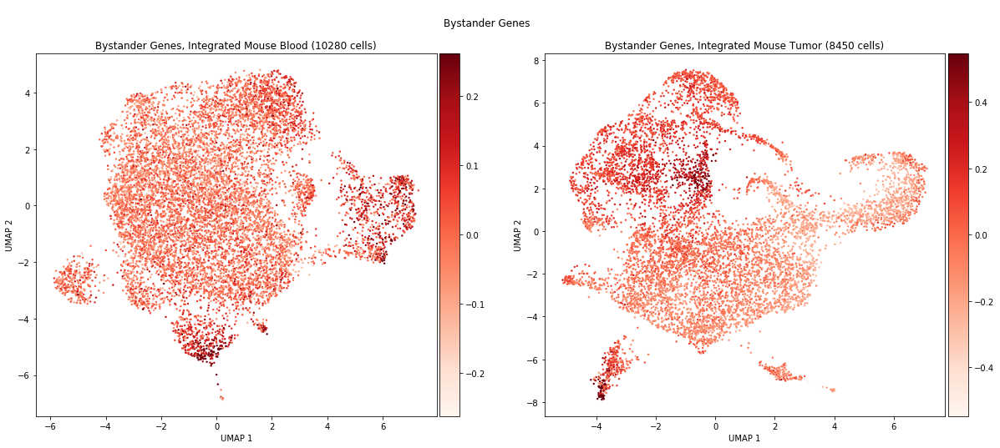

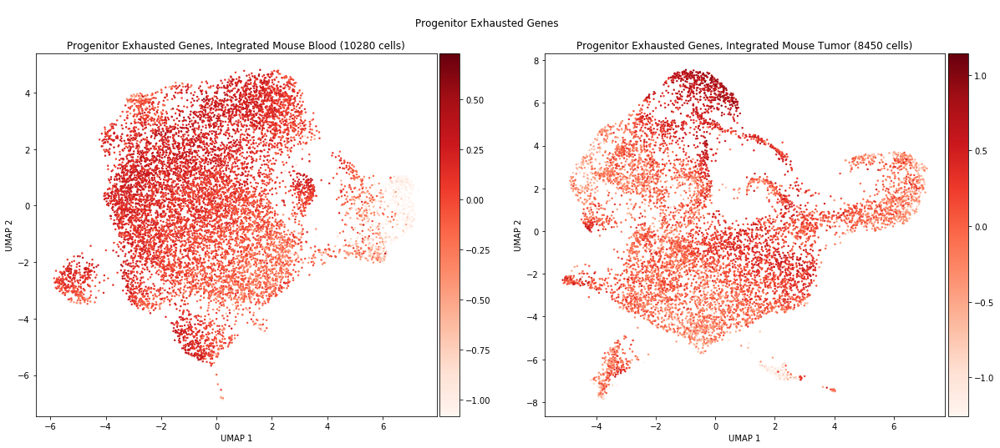

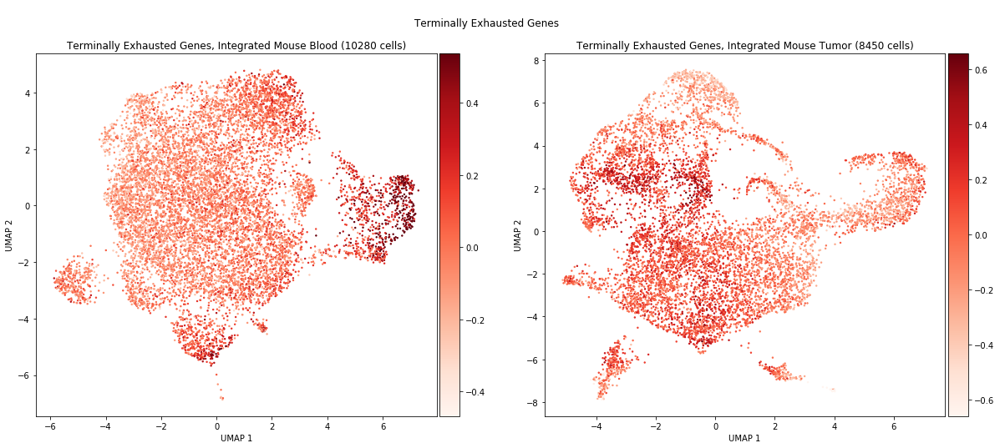

In [103]:
IntMeta = [MouseIntBlood_meta, MouseIntTumor_meta]
IntMtxs = [MouseIntBlood_mtxs, MouseIntTumor_mtxs]
IntAdata = [MouseIntBlood_adata, MouseIntTumor_adata]
S_names = ['Integrated Mouse Blood', 'Integrated Mouse Tumor']

# For each gene list
for i,genelist in enumerate(gene_lists):
    
    # Define 'score_name'
    score_name = gene_names[i]
    
    # Make a set of four axes
    fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(20,8))

    # For each integrated sample,
    for j,sample in enumerate(IntMeta):
        
        genes_to_plot = set(genelist) & set(IntAdata[j].var_names)
        
        # Run the score_genes module
        sc.tl.score_genes(IntAdata[j], genes_to_plot, score_name = score_name)

        # Transfer the gene scores back to the pandas metadata object
        IntMeta[j][score_name] = list(IntAdata[j].obs[score_name])
            
            
        # Extract the gene scores
        score_list = list(IntAdata[j].obs[score_name]).copy()
        
        # Fit the gene scores to a normal distribution
        mu, std = scipy.stats.norm.fit(score_list)
        
        # Define a threshold
        thresh1 = mu + 3*std
        thresh2 = mu - 3*std
        
        # If Naive genes, don't cap
        if i == 2:
            pass
        
        # Else, cap the data
        else:
            for e,ele in enumerate(score_list):
                if ele >= thresh1:
                    score_list[e] = thresh1
                elif ele <= thresh2:
                    score_list[e] = thresh2


        # Make a scatter plot
        im = ax[j].scatter(IntMeta[j]['UMAP_1'], IntMeta[j]['UMAP_2'],
                    c = score_list, s = 2, cmap=plt.cm.get_cmap('Reds'),
                    edgecolor = None)

        title = '{} Genes, {} ({} cells)'.format(gene_names[i],S_names[j], len(sample))
        
        ax[j].set_title(title)
        ax[j].set_xlabel("UMAP 1")
        ax[j].set_ylabel("UMAP 2")
        
        divider = make_axes_locatable(ax[j])
        cax = divider.append_axes('right', size='5%', pad=0.05)
        plt.colorbar(im, cax=cax, orientation='vertical')

    fig.suptitle("\n{} Genes".format(gene_names[i]))
    

    ### Figures that are generated
    # Fig1F_MouseIntBlood_ActivationUMAP
    # SuppFig1H_MouseIntBlood_CellCycleUMAP
    # SuppFig1I_MouseIntBlood_NaiveUMAP
    # SuppFig1J_MouseIntBlood_TRM_UMAP
    # 
    # SuppFig3B_MouseIntTumor_CellCycleUMAP
    # SuppFig3B_MouseIntTumor_NaiveUMAP
    # SuppFig3B_MouseIntTumor_TRM_UMAP
    # SuppFig3B_MouseIntTumor_BystanderUMAP
    # SuppFig3B_MouseIntTumor_TerminallyExhUMAP


    
    plt.show()

# Box Plots

### Create Function

In [104]:
def BoxPlots(sample, Blood_meta, Tumor_meta):
    
    pd.options.mode.chained_assignment = None    # Turn off this warning
    
    df_blood = AB_Clones(Blood_meta).copy()
    df_tumor = AB_Clones(Tumor_meta).copy()
    
    # Prepare the figures
    fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(16,10))

    # Make boxplots for blood
   
    # Plot
    df_blood['logClone_size'] = np.log10(df_blood['Clone.size'])               # Add log10('Clone.size')
    df_blood.drop_duplicates(subset = 'TCR', keep = 'first', inplace = True)   # Keep each TCR once
    
    # Make a column in df_tumor for the x-label of boxplots
    df_blood['Tumor Matching'] = ['nTM' if match == 'not_matching' else 'TM' for match in df_blood['Matching']]
    
    # Separate by matching
    TM =  df_blood[ df_blood['Matching'] != 'not_matching' ]
    nTM = df_blood[ df_blood['Matching'] == 'not_matching' ]
    
    # Calculate statistics
    stats,pval = scipy.stats.ranksums(TM['Clone.size'], nTM['Clone.size'])
    diff_mean = np.mean(TM['Clone.size']) - np.mean(nTM['Clone.size'])
    diff_median = np.median(TM['Clone.size']) - np.median(nTM['Clone.size'])
    
    
    # Plot for blood
    sns.boxplot(x = 'Tumor Matching', y = 'Clone.size', data = df_blood, order = ['nTM', 'TM'], ax = ax[0,0])
    title1 = sample + ' Blood\n'
    title2 = 'p-val = {:.2g}\n'.format(pval)
    title3 = 'Difference in means = {:.2g}\n'.format(diff_mean)
    title4 = 'Difference in medians = {:.2g}'.format(diff_median)
    title = title1 + title2 + title3 + title4
    ax[0,0].set_title(title)
    
    
    sns.boxplot(x = 'Tumor Matching', y = 'logClone_size', data = df_blood, order = ['nTM', 'TM'], ax = ax[0,1])
    ax[0,1].set_title('{} Blood (log10[Clone size])\np-val = {:.2g}'.format(sample,pval))
    ax[0,1].set_ylabel('log$_{10}$(Clone size)')


    
    # Make boxplots for tumor
    

    
    # Plot
    df_tumor['logClone_size'] = np.log10(df_tumor['Clone.size'])               # Add log10('Clone.size')
    df_tumor.drop_duplicates(subset = 'TCR', keep = 'first', inplace = True)   # Keep each TCR once
    
    # Make a column in df_tumor for the x-label of boxplots
    df_tumor['Blood Matching'] = ['nBM' if match == 'not_matching' else 'BM' for match in df_tumor['Matching']]
    
    
    # Separate by matching
    BM =  df_tumor[ df_tumor['Matching'] != 'not_matching' ]
    nBM = df_tumor[ df_tumor['Matching'] == 'not_matching' ]
    
    # Calculate statistics
    stats,pval = scipy.stats.ranksums(BM['Clone.size'], nBM['Clone.size'])
    diff_mean = np.mean(BM['Clone.size']) - np.mean(nBM['Clone.size'])
    diff_median = np.median(BM['Clone.size']) - np.median(nBM['Clone.size'])
    
    
    # Plot for tumor
    sns.boxplot(x = 'Blood Matching', y = 'Clone.size', data = df_tumor, order = ['nBM', 'BM'], ax = ax[1,0])
    title1 = sample + ' Tumor\n'
    title2 = 'p-val = {:.2g}\n'.format(pval)
    title3 = 'Difference in means = {:.2g}\n'.format(diff_mean)
    title4 = 'Difference in medians = {:.2g}'.format(diff_median)
    title = title1 + title2 + title3 + title4
    ax[1,0].set_title(title)
    
    
    sns.boxplot(x = 'Blood Matching', y = 'logClone_size', data = df_tumor, order = ['nBM', 'BM'], ax = ax[1,1])
    ax[1,1].set_title('{} Tumor (log10[Clone size])\np-val = {:.2g}'.format(sample,pval))
    ax[1,1].set_ylabel('log$_{10}$(Clone size)')  
    
    

    return ax
    

### Run on Individual Samples

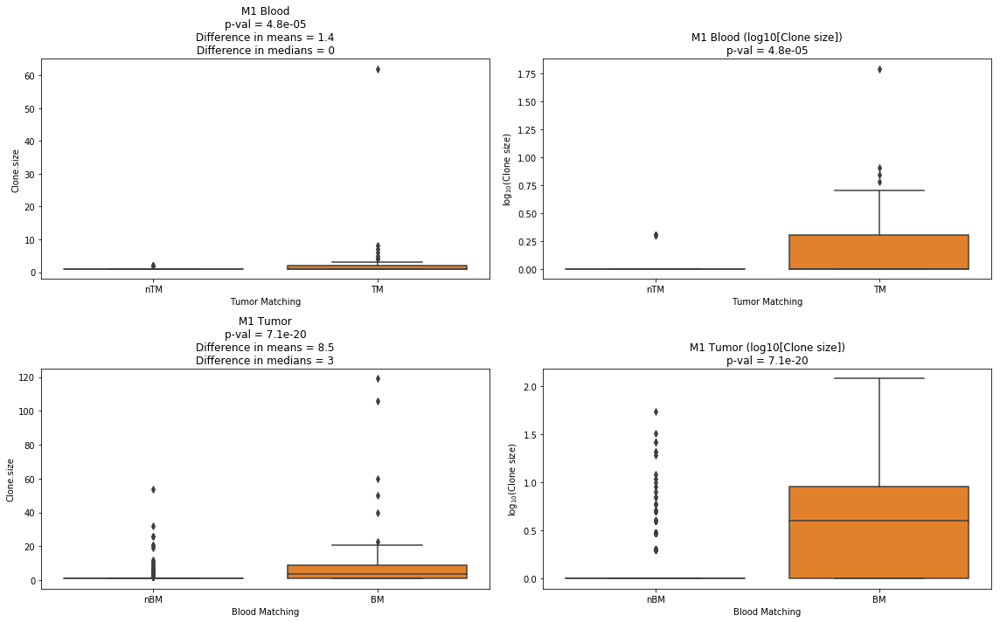

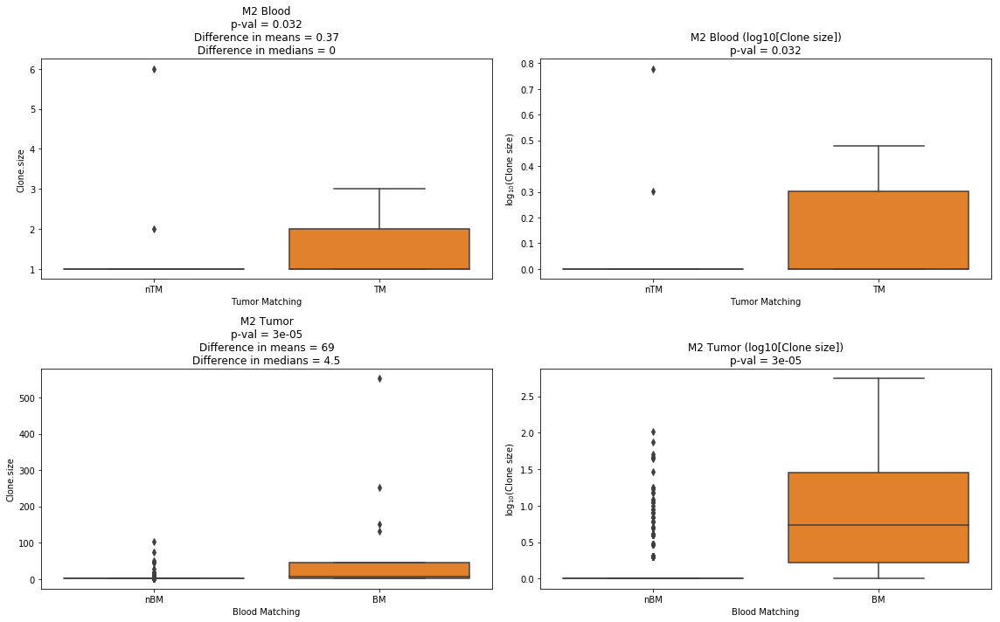

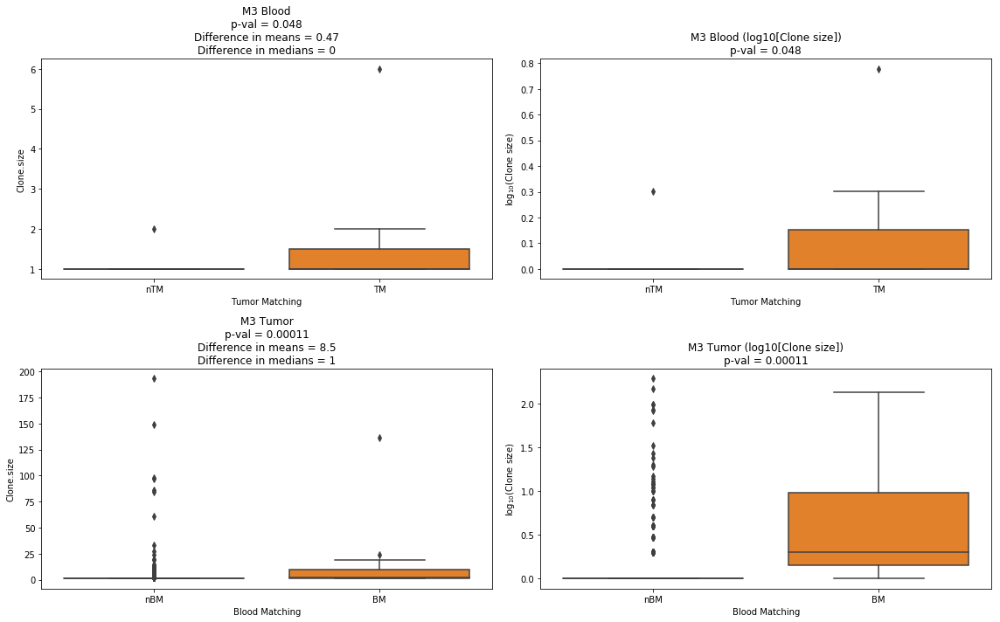

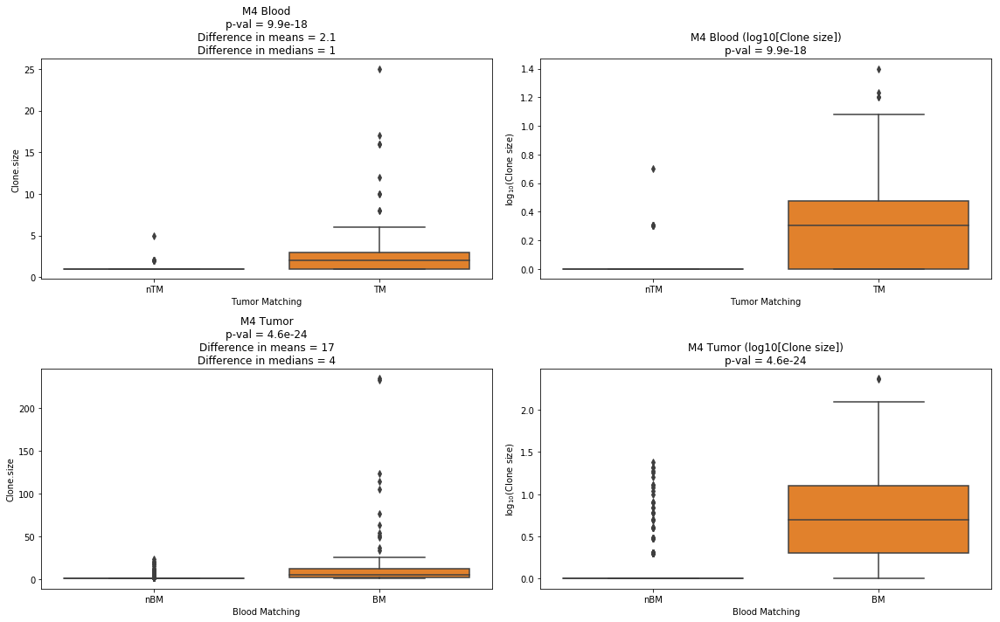

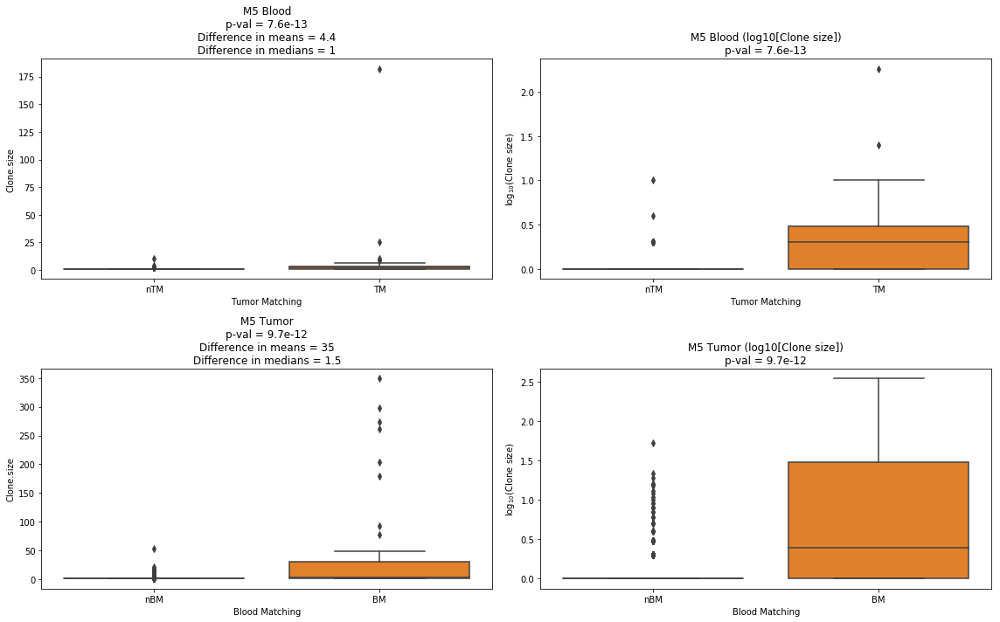

In [105]:
for i,sample in enumerate(samples):
    
    ax = BoxPlots(sample, Blood_meta[i], Tumor_meta[i])
    
    plt.tight_layout()
    plt.show()

### Run on Integrated Samples (Figures 1G and 3C)

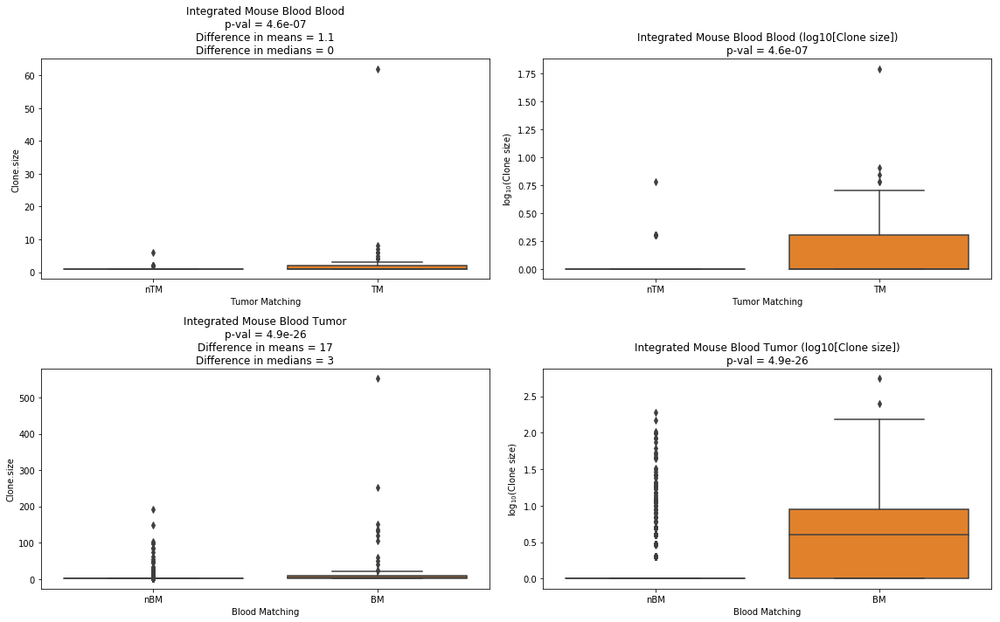

In [106]:
ax = BoxPlots('Integrated Mouse Blood', MouseIntBlood_meta, MouseIntTumor_meta)

plt.tight_layout()
plt.savefig('Figures/Fig1G_Fig3C_Boxplots.pdf')
plt.show()

# Violin Plots

In [107]:
def ViolinObject(meta, mtx):
    
    meta = AB_Clones(meta)             # Keep only AB clones in metadata
    mtx = mtx.loc[meta.index]          # Keep only AB clones in count matrix
    Adata = df_to_adata(mtx,meta)      # Create an adata object
    
    # Normalize
    sc.pp.normalize_per_cell(Adata, counts_per_cell_after=1e4)
    sc.pp.log1p(Adata)
    sc.pp.scale(Adata)
    
    return Adata

def MakeViolinPlots1(tissue, meta, mtx):
    
    if tissue == 'Blood':       
        # Add a label for each cell - either 'TM' or 'nTM' (tumor matching vs. non-tumor matching)
        meta['Tumor Matching'] = ['nTM' if match == 'not_matching' else 'TM' for match in meta['Matching'] ]
    
    if tissue == 'Tumor':    
        # Add a label for each cell - either 'BM' or 'nBM' (blood matching vs. non-blood matching)
        meta['Blood Matching'] = ['nBM' if match == 'not_matching' else 'BM' for match in meta['Matching'] ]
        
    # Create an normalized adata object for the tissue sample
    Adata = ViolinObject(meta, mtx)
    
    return Adata

def MakeViolinPlots2(Adata, genelist, score_name):
    
    # Extract the metadata
    df = Adata.obs
    
    # Find the intersection of the gene list and the genes in the adata object
    genes_to_plot = set(genelist) & set(Adata.var_names)
    
    # Find gene scores
    sc.tl.score_genes(Adata, genes_to_plot, score_name = score_name)
    
    # Add to metadata object
    df[score_name] = list(Adata.obs[score_name])
    
    return df



def MakeNM(j):
    
    # If j is odd, subtract 1 to make it even
    if j %2 != 0:
        n = (j - 1)//2
        
    else:
        n = j//2

    m = j % 2
    
    return n,m

### Blood

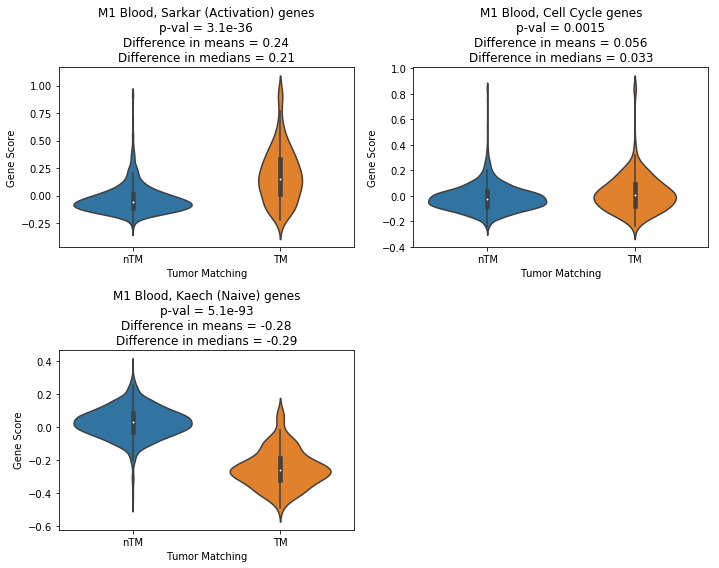

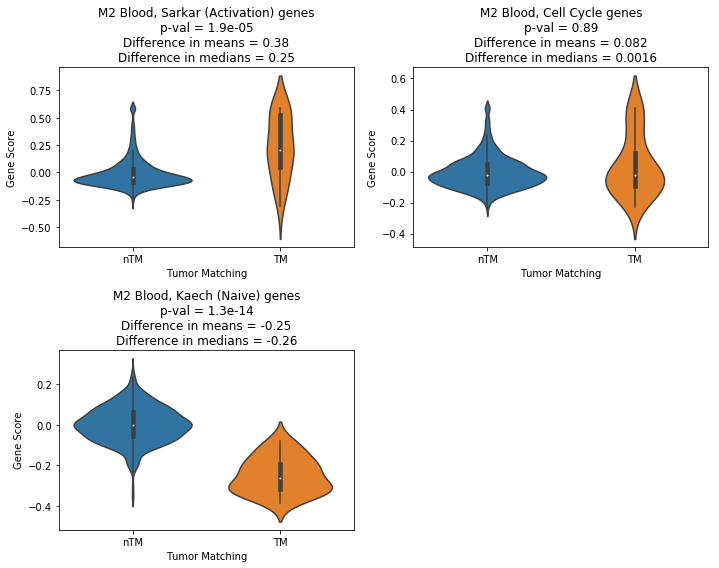

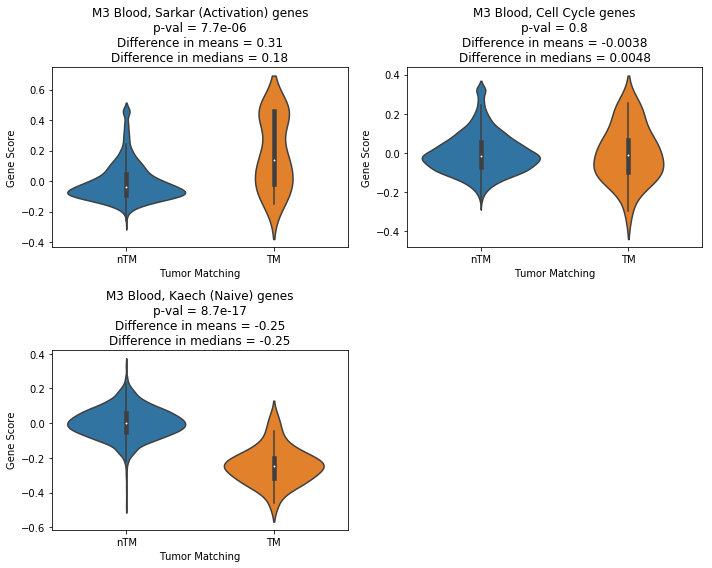

In [108]:
gene_lists = [sarkar_activation, cellcycle, kaech_naive]
gene_names = ['Sarkar (Activation)', 'Cell Cycle', 'Kaech (Naive)']

for i,sample in enumerate(samples[:3]):
    
    # Create a figure
    fig, axes = plt.subplots(nrows = 2, ncols = 2, figsize = (10,8))
    fig.delaxes(axes[1,1])
    
    Adata = MakeViolinPlots1('Blood', Blood_meta[i], Blood_mtxs[i])
    
    # For each gene list,
    for j,genelist in enumerate(gene_lists):
        score_name = gene_names[j]
        
        df = MakeViolinPlots2(Adata, genelist, score_name)
        
        # Create two lists to calculate statistics
        TM = df[ df['Tumor Matching'] == 'TM' ]
        nTM = df[ df['Tumor Matching'] == 'nTM' ]

        # p-value and differences
        stat,pval = scipy.stats.ranksums(TM[score_name], nTM[score_name])
        diff_mean = np.mean(TM[score_name]) - np.mean(nTM[score_name])
        diff_median = np.median(TM[score_name]) - np.median(nTM[score_name])
        
        # Fit the gene scores to a normal distribution
        score_list = list(df[score_name])
        mu, SD = scipy.stats.norm.fit(score_list)

        # Cap the scores
        # Define a threshold
        thresh1 = mu + 3*SD
        thresh2 = mu - 3*SD

        # If Naive genes, don't cap
        if score_name == 'Kaech (Naive)':
            pass

        # Else, cap the data
        else:
            for e,ele in enumerate(score_list):
                if ele >= thresh1:
                    score_list[e] = thresh1
                if ele <= thresh2:
                    score_list[e] = thresh2

        # Add the capped score list to the metadata
        df[score_name] = score_list

        # Determine the value of n,m from the value of j
        n,m = MakeNM(j)

        sns.violinplot(x = 'Tumor Matching', y = score_name, data = df, ax = axes[n,m], order = ['nTM','TM'])

        title1 = sample + ' Blood, {} genes\n'.format(score_name)
        title2 = 'p-val = {:.2g}\n'.format(pval)
        title3 = 'Difference in means = {:.2g}\n'.format(diff_mean)
        title4 = 'Difference in medians = {:.2g}'.format(diff_median)
        title = title1 + title2 + title3 + title4

        axes[n,m].set_title(title)
        axes[n,m].set_ylabel('Gene Score')
        
    plt.tight_layout()
    #plt.savefig(save_dir + sample + '_violin.pdf')
    plt.show()
    

### Tumor

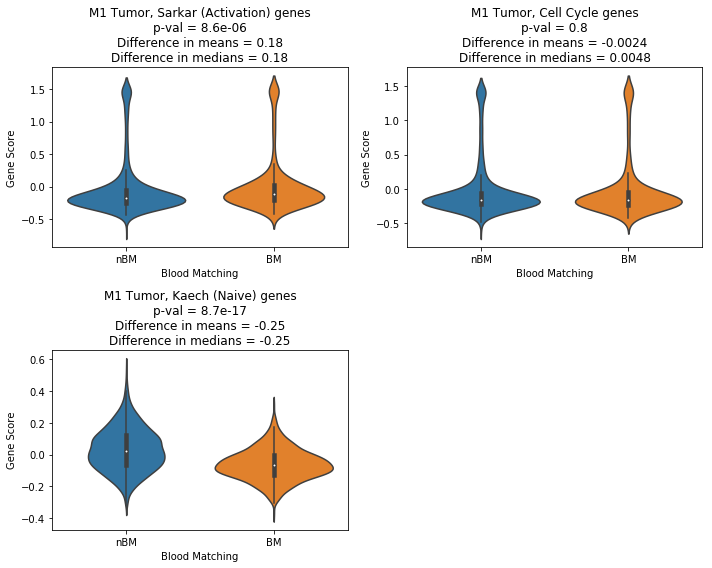

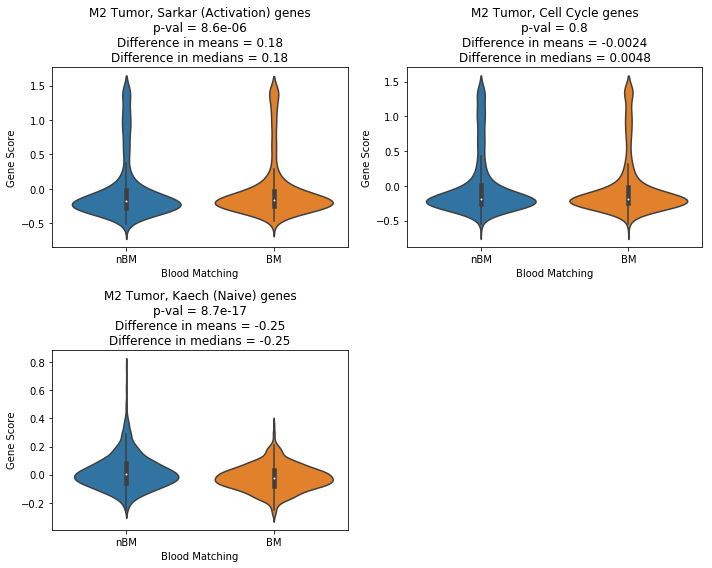

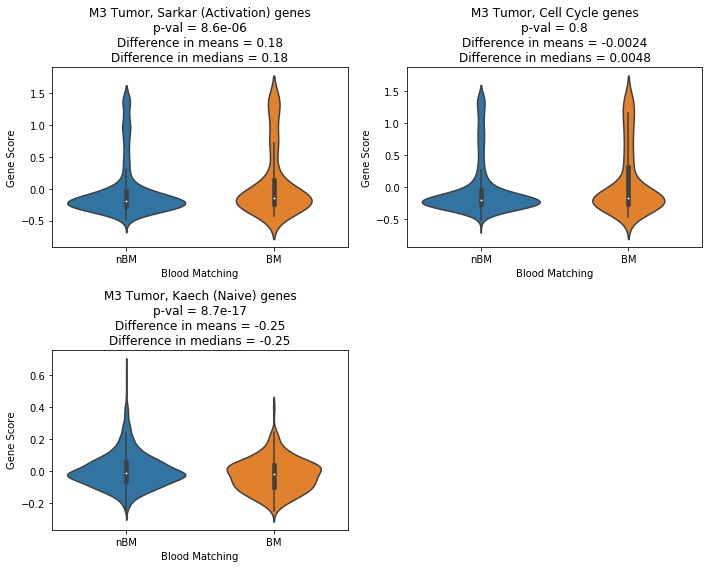

In [109]:
gene_lists = [sarkar_activation, cellcycle, kaech_naive]
gene_names = ['Sarkar (Activation)', 'Cell Cycle', 'Kaech (Naive)']

for i,sample in enumerate(samples[:3]):
    
    
    # Create a figure
    fig, axes = plt.subplots(nrows = 2, ncols = 2, figsize = (10,8))
    fig.delaxes(axes[1,1])
    
    Adata = MakeViolinPlots1('Tumor', Tumor_meta[i], Tumor_mtxs[i])

    for j,genelist in enumerate(gene_lists):
        score_name = gene_names[j]
        
        df = MakeViolinPlots2(Adata, genelist, score_name)

        # Create two lists to calculate statistics
        BM = df[ df['Blood Matching'] == 'BM' ]
        nBM = df[ df['Blood Matching'] == 'nBM' ]
        
        # p-value and differences
        stat,pval = scipy.stats.ranksums(TM[score_name], nTM[score_name])
        diff_mean = np.mean(TM[score_name]) - np.mean(nTM[score_name])
        diff_median = np.median(TM[score_name]) - np.median(nTM[score_name])
        
        # Fit the gene scores to a normal distribution
        score_list = list(df[score_name])
        mu, SD = scipy.stats.norm.fit(score_list)

        # Cap the scores
        # Define a threshold
        thresh1 = mu + 3*SD
        thresh2 = mu - 3*SD

        # If Naive genes, don't cap
        if score_name == 'Kaech (Naive)':
            pass

        # Else, cap the data
        else:
            for e,ele in enumerate(score_list):
                if ele >= thresh1:
                    score_list[e] = thresh1
                if ele <= thresh2:
                    score_list[e] = thresh2

        # Add the capped score list to the metadata
        df[score_name] = score_list

        # Determine the value of n,m from the value of j
        n,m = MakeNM(j)


        sns.violinplot(x = 'Blood Matching', y = score_name, data = df, ax = axes[n,m], order = ['nBM','BM'])

        title1 = sample + ' Tumor, {} genes\n'.format(score_name)
        title2 = 'p-val = {:.2g}\n'.format(pval)
        title3 = 'Difference in means = {:.2g}\n'.format(diff_mean)
        title4 = 'Difference in medians = {:.2g}'.format(diff_median)
        title = title1 + title2 + title3 + title4

        axes[n,m].set_title(title)
        axes[n,m].set_ylabel('Gene Score')
        
    plt.tight_layout()
    #plt.savefig(save_dir + sample + '_violin.pdf')
    plt.show()
    

### Run on Integrated Samples

In [111]:
gene_lists = [sarkar_activation, cellcycle, kaech_naive, TRM, bystander, progenitorexh, terminallyexh]
gene_names = ['Sarkar (Activation)', 'Cell Cycle', 'Kaech (Naive)', 'Tissue Resident Memory',
              'Bystander', 'Progenitor Exhausted', 'Terminally Exhausted']

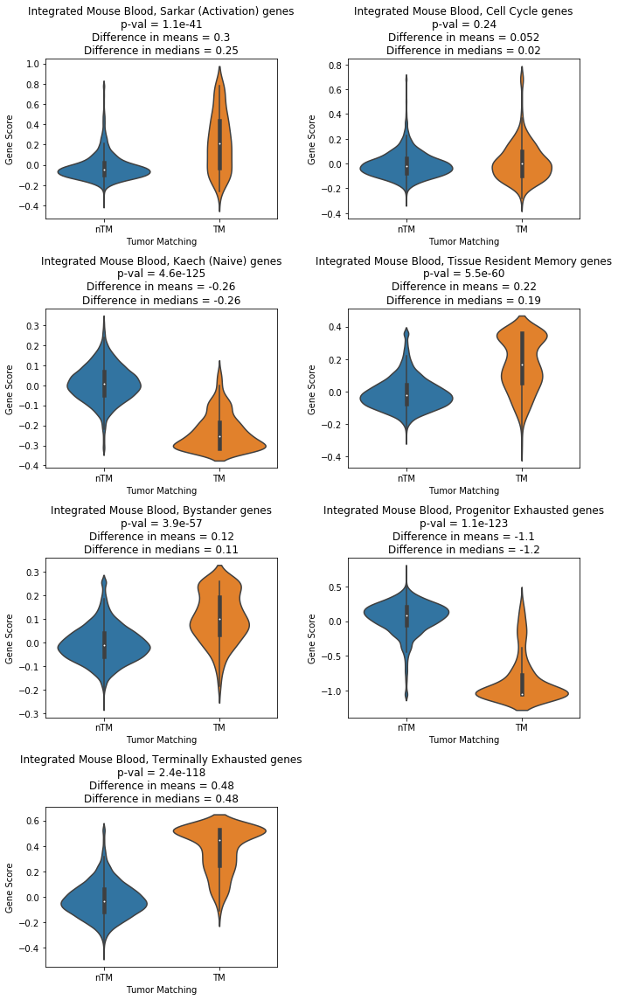

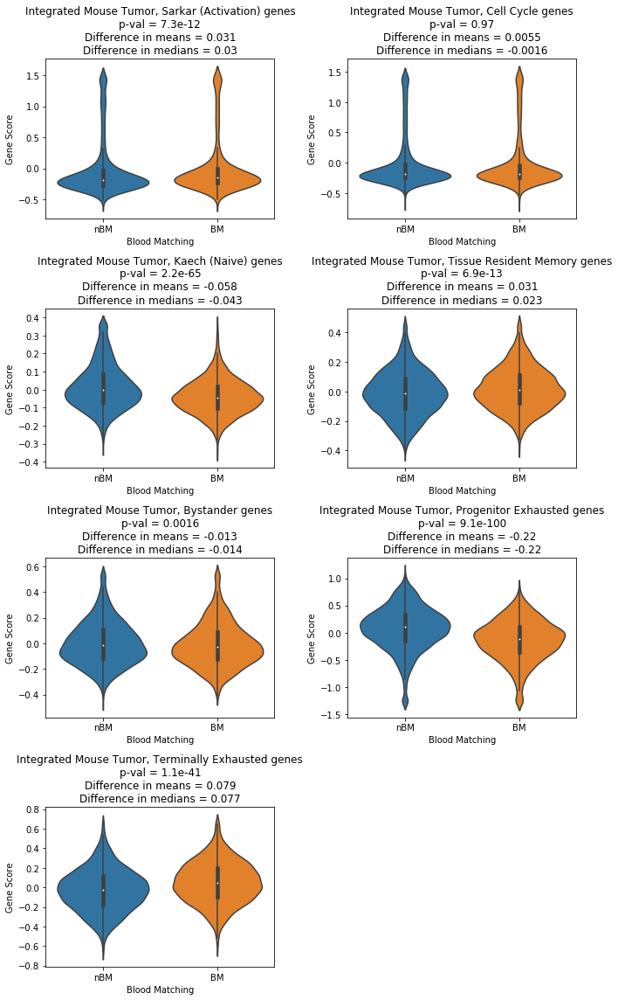

In [118]:
IntMeta = [MouseIntBlood_meta, MouseIntTumor_meta]
IntMtxs = [MouseIntBlood_mtxs, MouseIntTumor_mtxs]
IntNames = ["Integrated Mouse Blood", "Integrated Mouse Tumor"]

matching_types = ['M1_matching','M2_matching','M3_matching']

for i,sample in enumerate(IntNames):
    
    meta = IntMeta[i].copy()
    mtxs = IntMtxs[i].copy()
    
    fig, axes = plt.subplots(nrows = 4, ncols = 2, figsize = (10,16))
    fig.delaxes(axes[-1,-1])
    
    if i == 0:
        
        # Add a label for each cell - either 'TM' or 'nTM' (tumor matching vs. non-tumor matching)
        meta['Tumor Matching'] = ['TM' if match in matching_types else 'nTM' for match in meta['Matching'] ]      
        Adata = ViolinObject(meta, mtxs)
        
    if i == 1:
        
        # Add a label for each cell - either BM' or 'nBM' (blood matching vs. non-blood matching)
        meta['Blood Matching'] = ['BM' if match in matching_types else 'nBM' for match in meta['Matching'] ]
        Adata = ViolinObject(meta, mtxs)

    for j,genelist in enumerate(gene_lists):
        score_name = gene_names[j]
    
        df = MakeViolinPlots2(Adata, genelist, score_name)
        
        if i == 0:
            
            # Create two lists to calculate statistics
            TM = df[ df['Tumor Matching'] == 'TM' ]
            nTM = df[ df['Tumor Matching'] == 'nTM' ]

            # p-value and differences
            stat,pval = scipy.stats.ranksums(TM[score_name], nTM[score_name])
            diff_mean = np.mean(TM[score_name]) - np.mean(nTM[score_name])
            diff_median = np.median(TM[score_name]) - np.median(nTM[score_name])
            
            # Fit the gene scores to a normal distribution
            score_list = list(df[score_name])
            mu, SD = scipy.stats.norm.fit(score_list)

            # Cap the scores
            # Define a threshold
            thresh1 = mu + 3*SD
            thresh2 = mu - 3*SD

            # If Naive genes, don't cap
            if score_name == 'Naive':
                pass

            # Else, cap the data
            else:
                for e,ele in enumerate(score_list):
                    if ele >= thresh1:
                        score_list[e] = thresh1
                    if ele <= thresh2:
                        score_list[e] = thresh2

            # Add the capped score list to the metadata
            df[score_name] = score_list

            # Determine the value of n,m from the value of j
            n,m = MakeNM(j)

            sns.violinplot(x = 'Tumor Matching', y = score_name, data = df, ax = axes[n,m], order = ['nTM','TM'])

            
        
        if i == 1:
        
            # Create two lists to calculate statistics
            BM = df[ df['Blood Matching'] == 'BM' ]
            nBM = df[ df['Blood Matching'] == 'nBM' ]

            # p-value and differences
            stat,pval = scipy.stats.ranksums(BM[score_name], nBM[score_name])
            diff_mean = np.mean(BM[score_name]) - np.mean(nBM[score_name])
            diff_median = np.median(BM[score_name]) - np.median(nBM[score_name])
            
            # Fit the gene scores to a normal distribution
            score_list = list(df[score_name])
            mu, SD = scipy.stats.norm.fit(score_list)

            # Cap the scores
            # Define a threshold
            thresh1 = mu + 3*SD
            thresh2 = mu - 3*SD

            # If Naive genes, don't cap
            if score_name == 'Naive':
                pass

            # Else, cap the data
            else:
                for e,ele in enumerate(score_list):
                    if ele >= thresh1:
                        score_list[e] = thresh1
                    if ele <= thresh2:
                        score_list[e] = thresh2

            # Add the capped score list to the metadata
            df[score_name] = score_list

            # Determine the value of n,m from the value of j
            n,m = MakeNM(j)

            sns.violinplot(x = 'Blood Matching', y = score_name, data = df, ax = axes[n,m], order = ['nBM','BM'])
        
        

        title1 = IntNames[i] + ', {} genes\n'.format(score_name)
        title2 = 'p-val = {:.2g}\n'.format(pval)
        title3 = 'Difference in means = {:.2g}\n'.format(diff_mean)
        title4 = 'Difference in medians = {:.2g}'.format(diff_median)
        title = title1 + title2 + title3 + title4

        axes[n,m].set_title(title)
        axes[n,m].set_ylabel('Gene Score')
        
    plt.tight_layout()
    #plt.savefig(save_dir + savenames[i] + '_violin.pdf')
    plt.show()
    
    
    

# Count alpha and beta chains in TCR sequences

### Create a Function to Count Chains

In [119]:
def CountTCRchains(df):
    
    TCR_list = list(df['TCR'])          # Make a list of each TCR sequence
    
    max_chain_a = 0
    max_chain_b = 0
    
    for TCR in TCR_list:
        if TCR == 'notcr' or TCR is np.nan:
            
            continue
            
        a = TCR.split("|")[0]
        b = TCR.split("|")[1] 
        
        if len(a.split("-")) >= max_chain_a:
            max_chain_a = len(a.split("-")) + 1
        
        if len(b.split("-")) >= max_chain_b:
            max_chain_b = len(b.split("-")) + 1
    
    count_array = np.zeros([max_chain_a,max_chain_b], int)

    
    for TCR in TCR_list:
        
        # If TCR isn't sequenced, just skip the TCR
        if TCR == 'notcr' or TCR == 'nan' or TCR == 'NaN' or TCR is np.nan:
            alpha = 0
            beta = 0

            
        else:        
            # Define 'a' as the alpha chain and 'b' as the beta chain
            a = TCR.split("|")[0]
            b = TCR.split("|")[1]
            
            
            if a == '':
                alpha = 0
            else:
                alpha = len(a.split("-"))
            
            
            if b == '':
                beta = 0
            else:
                beta = len(b.split("-"))

        count_array[alpha,beta] += 1
        

        
    return(count_array)

### Run on Individual Blood Objects

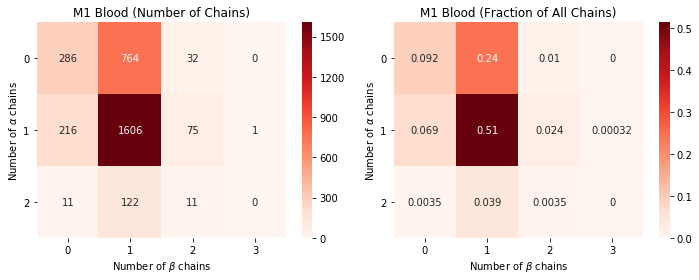

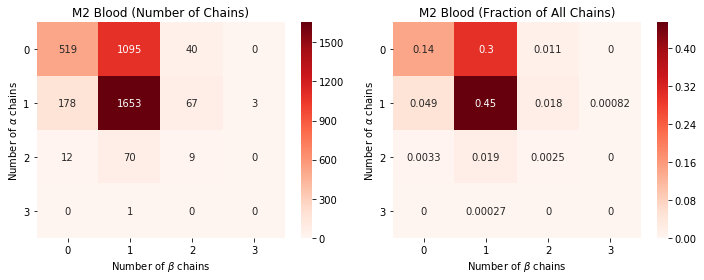

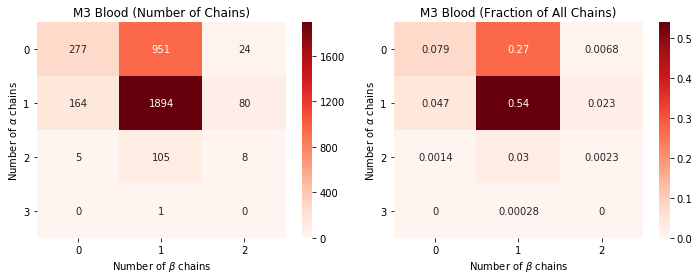

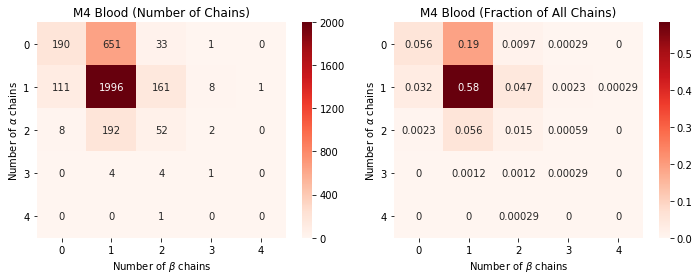

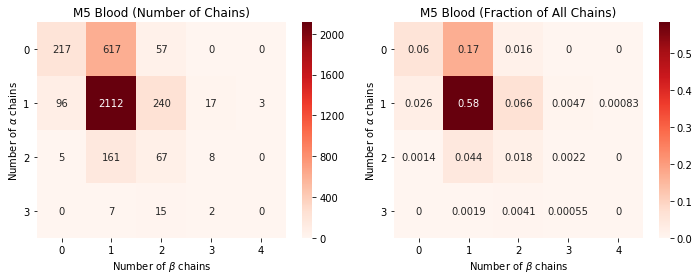

In [120]:
for i,sample in enumerate(samples):

    mtx = CountTCRchains(Blood_meta[i])
    nmtx = mtx/np.sum(mtx)


    fig,(ax1,ax2) = plt.subplots(nrows=1, ncols=2, figsize=(10,4))

    sns.heatmap(mtx, ax=ax1, cmap = 'Reds', annot=True, fmt="d")
    ax1.set_title(sample + " Blood (Number of Chains)")
    ax1.set_xlabel(r"Number of $\beta$ chains")
    ax1.set_ylabel(r"Number of $\alpha$ chains")
    ax1.tick_params(labelrotation=0)

    sns.heatmap(nmtx, ax=ax2, cmap = 'Reds', annot=True, fmt=".2g")
    ax2.set_title(sample + " Blood (Fraction of All Chains)")
    ax2.set_xlabel(r"Number of $\beta$ chains")
    ax2.set_ylabel(r"Number of $\alpha$ chains")
    ax2.tick_params(labelrotation=0)

    plt.tight_layout()
    plt.show()

### Run on Individual Tumor Objects

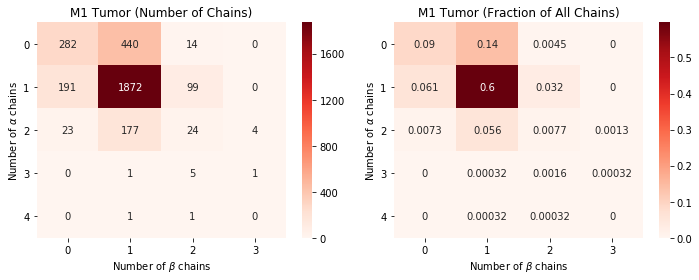

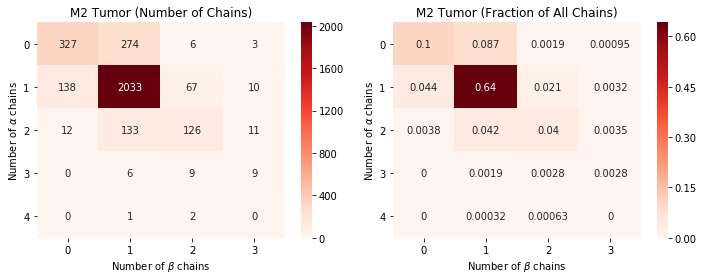

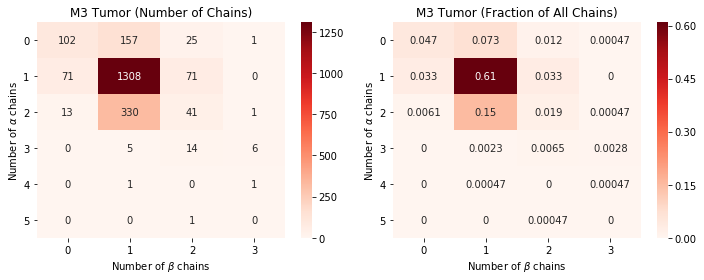

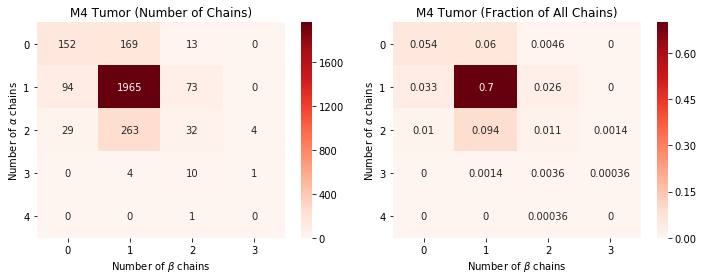

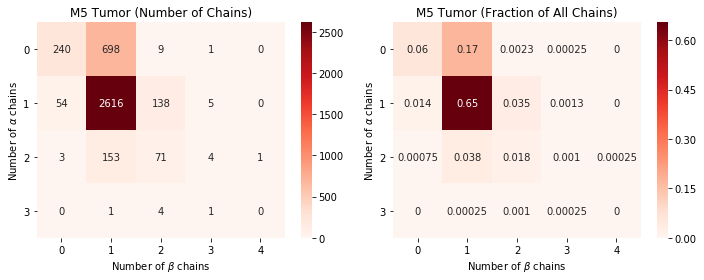

In [121]:
for i,sample in enumerate(samples):

    mtx = CountTCRchains(Tumor_meta[i])
    nmtx = mtx/np.sum(mtx)


    fig,(ax1,ax2) = plt.subplots(nrows=1, ncols=2, figsize=(10,4))

    sns.heatmap(mtx, ax=ax1, cmap = 'Reds', annot=True, fmt="d")
    ax1.set_title(sample + " Tumor (Number of Chains)")
    ax1.set_xlabel(r"Number of $\beta$ chains")
    ax1.set_ylabel(r"Number of $\alpha$ chains")
    ax1.tick_params(labelrotation=0)

    sns.heatmap(nmtx, ax=ax2, cmap = 'Reds', annot=True, fmt=".2g")
    ax2.set_title(sample + " Tumor (Fraction of All Chains)")
    ax2.set_xlabel(r"Number of $\beta$ chains")
    ax2.set_ylabel(r"Number of $\alpha$ chains")
    ax2.tick_params(labelrotation=0)

    plt.tight_layout()
    plt.show()

### Run on Integrated Objects

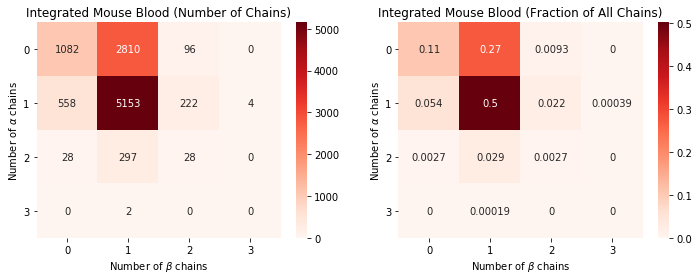

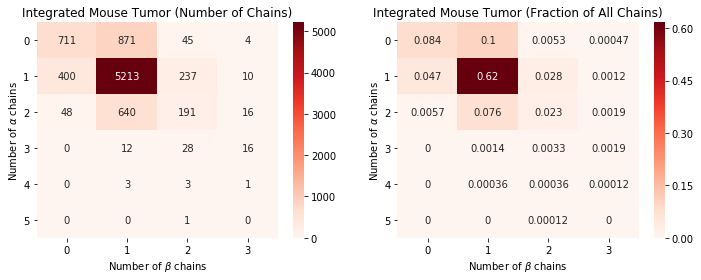

In [122]:
Integrated = [MouseIntBlood_meta, MouseIntTumor_meta]
IntNames = ["Integrated Mouse Blood", "Integrated Mouse Tumor"]
savenames = ["MouseIntBlood", "MouseIntTumor"]

for i,sample in enumerate(Integrated):  
    
    mtx = CountTCRchains(sample)
    nmtx = mtx/np.sum(mtx)


    fig,(ax1,ax2) = plt.subplots(nrows=1, ncols=2, figsize=(10,4))

    sns.heatmap(mtx, ax=ax1, cmap = 'Reds', annot=True, fmt="d")
    ax1.set_title(IntNames[i] + " (Number of Chains)")
    ax1.set_xlabel(r"Number of $\beta$ chains")
    ax1.set_ylabel(r"Number of $\alpha$ chains")
    ax1.tick_params(labelrotation=0)

    sns.heatmap(nmtx, ax=ax2, cmap = 'Reds', annot=True, fmt=".2g")
    ax2.set_title(IntNames[i] + " (Fraction of All Chains)")
    ax2.set_xlabel(r"Number of $\beta$ chains")
    ax2.set_ylabel(r"Number of $\alpha$ chains")
    ax2.tick_params(labelrotation=0)

    plt.tight_layout()
    #plt.savefig(save_dir + savenames[i] +'_alpha_beta.pdf')
    
    if i == 0:
        extent = ax2.get_window_extent().transformed(fig.dpi_scale_trans.inverted())
        fig.savefig('Figures/SuppFig1G_MouseIntBlood_alpha_beta_fractions.pdf',
                    bbox_inches=extent.expanded(1.45, 1.55))
        
    if i == 1:
        extent = ax2.get_window_extent().transformed(fig.dpi_scale_trans.inverted())
        fig.savefig('Figures/SuppFig1G_MouseIntTumor_alpha_beta_fractions.pdf',
                    bbox_inches=extent.expanded(1.45, 1.55))
    
    
    
    
    
    plt.show()

# Count Cells in Each Cluster

In [137]:
def CountCells(meta):
    
    # Get metadata
    df = meta.copy()
    df_AB = AB_Clones(meta).copy()
    
    # Define list of possible matching cell status
    Matching_list = ['matching', 'M1_matching', 'M2_matching', 'M3_matching']
    
    # Get list of clusters
    cluster_numbers = sorted(list(df['Seurat_clusters'].unique()), key = int)
    
    GEX = np.zeros(len(cluster_numbers), dtype = int)
    AB =  np.zeros(len(cluster_numbers), dtype = int)
    Matching = np.zeros(len(cluster_numbers), dtype = int)
    
    # Loop over each cluster
    for i,cluster in enumerate(cluster_numbers):
        
        # Subset data to keep only cells in that cluster
        df_clus = df[ df['Seurat_clusters'] == cluster ]              # All cells
        df_clus_AB = df_AB[ df_AB['Seurat_clusters'] == cluster ]     # AB cells
        
        # Number of cells in the cluster
        GEX[i] = len(df_clus)
        
        # Number of AB cells
        AB[i] = len(df_clus_AB)
        
        # Number of matching cells
        Matching[i] = len(df_clus_AB[ df_clus_AB['Matching'] != 'not_matching' ])
        
    # Percent matching
    PercentMatching = np.round(Matching/AB, decimals = 2)
        
    return(GEX, AB, Matching, PercentMatching)

In [138]:
def CountCells_to_df(Metas, tissue):
    
    # Empty dataframe
    df = pd.DataFrame()
    
    # Loop over each sample
    for i,sample in enumerate(samples[:3]):

        # Get number of cells per cluster
        GEX, AB, Matching, PercentMatching = CountCells(Metas[i])
        sample_key = sample + '_' + tissue

        # Summarize results into dataframe
        d = {sample_key + ' # of GEX cells': GEX,
             sample_key + ' # of AB cells':  AB,
             sample_key + ' # of Matching cells': Matching,
             sample_key + ' % of Matching cells': PercentMatching}

        # Merge into dataframe for all samples
        df = pd.concat([df, pd.DataFrame(d)], axis = 1)

    # Rename index
    df.index.name = 'Cluster'

    Sum = np.array(df.sum(axis=0, numeric_only = True), dtype = int)
    df.loc['Sum'] = Sum
    df = df.fillna('-')
    
    return(df)

### Count Cells for Individual Blood and Tumor Samples

In [139]:
blood_df = CountCells_to_df(Blood_meta, 'Blood')
tumor_df = CountCells_to_df(Tumor_meta, 'Tumor')

### Count Cells for Integrated Blood and Tumor Samples

In [141]:
GEX, AB, Matching, PercentMatching = CountCells(MouseIntBlood_meta)
sample_key = 'IntMouseBlood'

# Summarize results into dataframe
d = {sample_key + ' # of GEX cells': GEX,
     sample_key + ' # of AB cells':  AB,
     sample_key + ' # of Matching cells': Matching,
     sample_key + ' % of Matching cells': PercentMatching}

IntBlood_df = pd.DataFrame(d)
IntBlood_df.index.name = 'Cluster'
Sum = np.array(IntBlood_df.sum(axis=0, numeric_only = True), dtype = int)
IntBlood_df.loc['Sum'] = Sum

In [142]:
GEX, AB, Matching, PercentMatching = CountCells(MouseIntTumor_meta)
sample_key = 'IntMouseTumor'

# Summarize results into dataframe
d = {sample_key + ' # of GEX cells': GEX,
     sample_key + ' # of AB cells':  AB,
     sample_key + ' # of Matching cells': Matching,
     sample_key + ' % of Matching cells': PercentMatching}

IntTumor_df = pd.DataFrame(d)
IntTumor_df.index.name = 'Cluster'
Sum = np.array(IntTumor_df.sum(axis=0, numeric_only = True), dtype = int)
IntTumor_df.loc['Sum'] = Sum

# Make Stacked Barplots

### Create Function

In [143]:
def MakeStackedBarplots(df, sample):
    
    # Create a figure with a single subplot
    fig, ax = plt.subplots(1, figsize=(10,5))
    
    # Remove any strings
    df = df.replace('-', np.nan)
    df = df.dropna()

    # Number of AB cells across clusters
    AB = df[[col for col in df.columns if 'AB' in col]].values.flatten()
    
    # Number of Matching cells across clusters
    Matching = df[[col for col in df.columns if '# of Matching' in col]].values.flatten()
    
    # Set up the plot
    
    # Set bar width at 1
    bar_width = 0.85

    # positions of the left bar-boundaries
    bar_l = [i for i in range(len(AB))] 

    # positions of the x-axis ticks (center of the bars as bar labels)
    tick_pos = [i for i in bar_l] 
    
    bottom = [k/j * 100 for j,k in zip(AB, Matching)]
    top    = [(j-k)/j * 100 for j,k in zip(AB, Matching)]
    
    ax.bar(bar_l, bottom, label='% Matching', alpha=0.9, color='blue', width=bar_width, edgecolor='white')
    ax.bar(bar_l, top, bottom=bottom, label='% non-Matching', alpha=0.9, color='#019600', width=bar_width,
           edgecolor='white')
    
    tick_labels = [x for x in df.index]
    plt.xticks(tick_pos, tick_labels)
    ax.set_ylabel("Percent of Matching Cells")
    ax.set_xlabel("Cluster")
    ax.set_title(sample)
    plt.legend()
    plt.show()
    
    return fig, ax

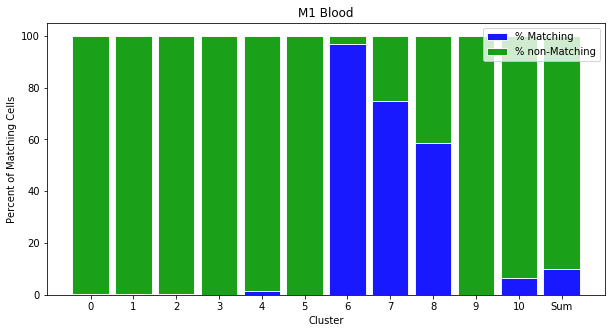

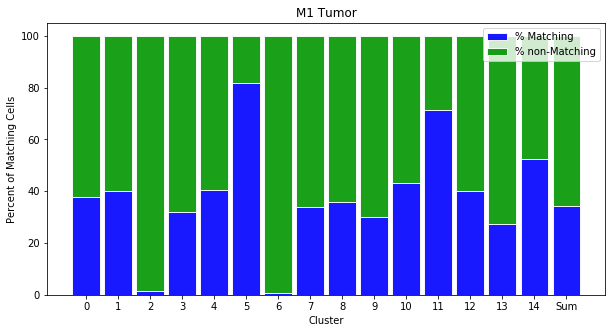

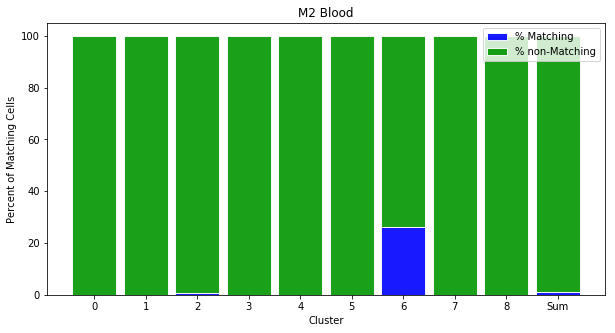

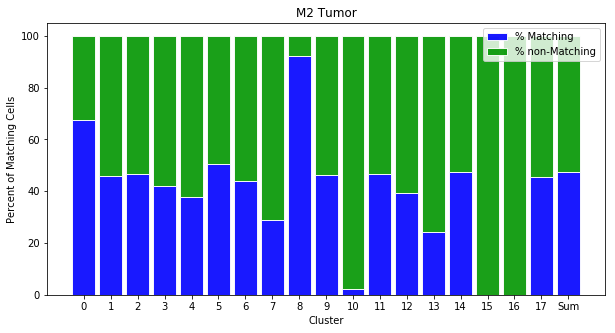

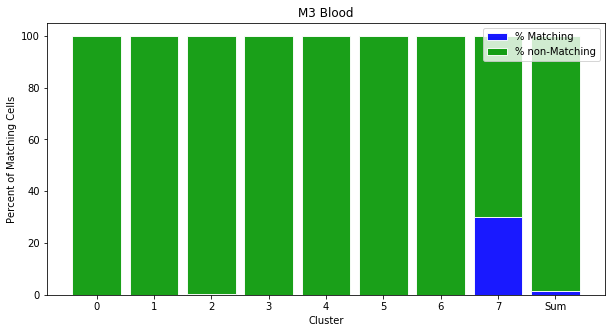

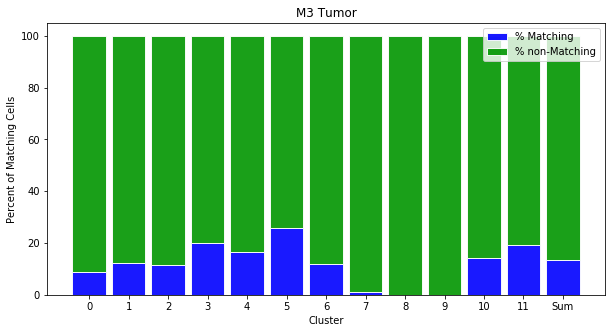

In [144]:
for i,sample in enumerate(samples[:3]):
    
    # Subset dataframe to keep only data from that blood sample
    df = blood_df[[col for col in blood_df.columns if sample in col]]
    fig, ax = MakeStackedBarplots(df, sample + ' Blood')
    
    
    # Subset dataframe to keep only data from that tumor sample
    df = tumor_df[[col for col in tumor_df.columns if sample in col]]
    fig, ax = MakeStackedBarplots(df, sample + ' Tumor')

### Run on Integrated Samples

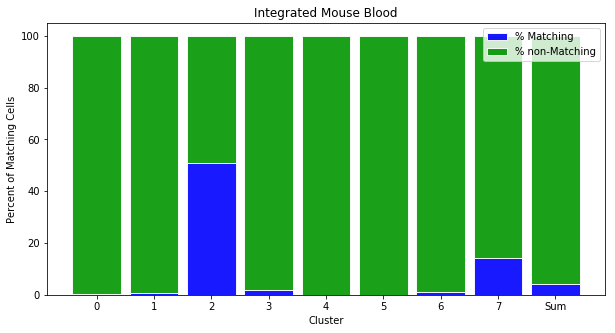

<Figure size 432x288 with 0 Axes>

In [145]:
# NOTE: In the paper, cluster 7 was removed since it had fewer than 50 cells
fig, ax = MakeStackedBarplots(IntBlood_df, 'Integrated Mouse Blood')
plt.savefig('Figures/Fig3B_MouseIntBlood_StackedBarPlotClusters.pdf')

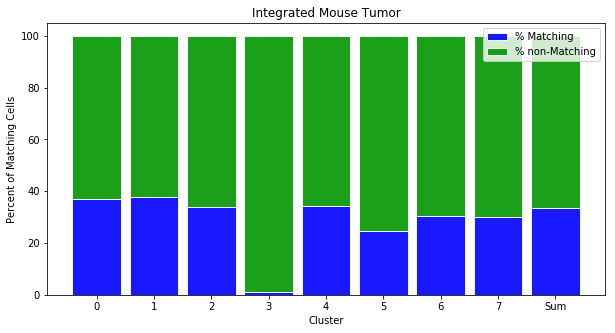

<Figure size 432x288 with 0 Axes>

In [146]:
fig, ax = MakeStackedBarplots(IntTumor_df, 'Integrated Mouse Tumor')
plt.savefig('Figures/Fig3B_MouseIntTumor_StackedBarPlotClusters.pdf')

# Make Data for Fig S1A

In [148]:
for i,sample in enumerate(samples[:3]):

    # Total number of GEX barcodes
    all_cells = len(Blood_meta[i])
    
    # Keep only AB clones; total number of AB cells
    df = AB_Clones(Blood_meta[i])
    ab_cells = len(df)
    
    # Total number (and percent) of tumor matching cells
    matching = len(df[ df['Matching'] == 'matching'])
    perc_matching = np.round(matching/ab_cells * 100, decimals=2)
    
    # All cells that are tumor_matching in count matrix
    df_mtx = Blood_mtxs[i].loc[ df[ df['Matching'] == 'matching'].index ]
    matching_PD1 = np.count_nonzero(df_mtx['PDCD1'])
    
    # Percentage of PD1+ cells that are tumor matching
    matching_PD1 = np.round(matching_PD1/matching*100, decimals=2)
    
    data = [all_cells,ab_cells,matching,perc_matching,matching_PD1]

    print('\nFor sample {}:'.format(sample))
    print('There are {} GEX barcodes, {} AB cells, and {} tumor-matching cells.'.format(*data[:3]))
    print('{:.2f}% of AB cells are tumor matching, and {:.2f}% of tumor matching cells are PD1+.'.format(*data[3:]))


For sample M1:
There are 3124 GEX barcodes, 1815 AB cells, and 183 tumor-matching cells.
10.08% of AB cells are tumor matching, and 11.48% of tumor matching cells are PD1+.

For sample M2:
There are 3647 GEX barcodes, 1803 AB cells, and 22 tumor-matching cells.
1.22% of AB cells are tumor matching, and 9.09% of tumor matching cells are PD1+.

For sample M3:
There are 3509 GEX barcodes, 2088 AB cells, and 28 tumor-matching cells.
1.34% of AB cells are tumor matching, and 10.71% of tumor matching cells are PD1+.


In [149]:
for i,sample in enumerate(samples[:3]):

    # Total number of GEX barcodes
    all_cells = len(Tumor_meta[i])
    
    # Keep only AB clones; total number of AB cells
    df = AB_Clones(Tumor_meta[i])
    ab_cells = len(df)
    
    # Total number (and percent) of blood matching cells
    matching = len(df[ df['Matching'] == 'matching'])
    perc_matching = np.round(matching/ab_cells * 100, decimals=2)
    
    # All cells that are blood_matching in count matrix
    df_mtx = Tumor_mtxs[i].loc[ df[ df['Matching'] == 'matching'].index ]
    matching_PD1 = np.count_nonzero(df_mtx['PDCD1'])
    
    # Percentage of PD1+ cells that are blood matching
    matching_PD1 = np.round(matching_PD1/matching*100, decimals=2)
    
    data = [all_cells,ab_cells,matching,perc_matching,matching_PD1]

    print('\nFor sample {}:'.format(sample))
    print('There are {} GEX barcodes, {} AB cells, and {} blood-matching cells.'.format(*data[:3]))
    print('{:.2f}% of AB cells are blood matching, and {:.2f}% of blood matching cells are PD1+.'.format(*data[3:]))


For sample M1:
There are 3135 GEX barcodes, 2185 AB cells, and 752 blood-matching cells.
34.42% of AB cells are blood matching, and 74.60% of blood matching cells are PD1+.

For sample M2:
There are 3167 GEX barcodes, 2407 AB cells, and 1144 blood-matching cells.
47.53% of AB cells are blood matching, and 94.49% of blood matching cells are PD1+.

For sample M3:
There are 2148 GEX barcodes, 1779 AB cells, and 239 blood-matching cells.
13.43% of AB cells are blood matching, and 85.77% of blood matching cells are PD1+.


# Make Clone size Plots

### Create Functions

In [151]:
def set_logsx(axes,vector):
    if max(vector) > 1000:
        axes.xaxis.set_minor_locator(MultipleLocator(100))
        return axes.set_xlim(right=max(vector)+1000)
    
    elif max(vector) > 100:
        axes.xaxis.set_minor_locator(MultipleLocator(100))
        return axes.set_xlim(right=1000)
    
    elif max(vector) > 10:
        axes.xaxis.set_minor_locator(MultipleLocator(10))
        return axes.set_xlim(right=100)
    
    else:
        axes.xaxis.set_minor_locator(MultipleLocator(1))
        return axes.set_xlim(right=10)
    
def set_logsy(axes,vector):
    if max(vector) > 1000:
        axes.yaxis.set_minor_locator(MultipleLocator(100))
        return axes.set_ylim(top=max(vector)+1000)
    
    elif max(vector) > 100:
        axes.yaxis.set_minor_locator(MultipleLocator(100))
        return axes.set_ylim(top=1000)
    
    elif max(vector) > 10:
        axes.yaxis.set_minor_locator(MultipleLocator(10))
        return axes.set_ylim(top=100)
    
    else:
        axes.yaxis.set_minor_locator(MultipleLocator(1))
        return axes.set_ylim(top=10)

In [165]:
def ExtractCloneSize(df,TCR):
    
    CS = df[ df['TCR'].isin([TCR]) ]['Clone.size'].unique()
    return int(CS[0])
        

def CountTCRs(df_blood, df_tumor, sample):
    
    df_blood = df_blood.copy()
    df_tumor = df_tumor.copy()
    
    # Keep all AB clones
    df_blood = AB_Clones(df_blood)[['Clone.size','TCR']]
    df_tumor = AB_Clones(df_tumor)[['Clone.size','TCR']]

    # Create emtpy lists that will be extended later
    Blood_freq = []
    Tumor_freq = []
    TCR_list = []
    sizes = []

    # List of all the TCRs in each sample
    blood_TCRs = list(df_blood['TCR'])
    tumor_TCRs = list(df_tumor['TCR'])

    # Union of all TCRS
    Union_TCRs = set(blood_TCRs) | set(tumor_TCRs)
    Union_TCRs = sorted(Union_TCRs)

    # Empty lists
    blood_freq = [0]*len(Union_TCRs)
    tumor_freq = [0]*len(Union_TCRs)

    for i,TCR in enumerate(Union_TCRs):

        if TCR in list(blood_TCRs):
            blood_freq[i] = ExtractCloneSize(df_blood, TCR)

        if TCR in list(tumor_TCRs):
            tumor_freq[i] = ExtractCloneSize(df_tumor, TCR)

    TCR_list.extend(Union_TCRs)
    Blood_freq.extend(blood_freq)
    Tumor_freq.extend(tumor_freq)

    size_dict = Counter(zip(blood_freq,tumor_freq))
    sizes.extend([size_dict[coords] for coords in tuple(zip(blood_freq,tumor_freq))])
        
        
    # Create a dataframe to plot information, and add 'sizes' and log scaled 'sizes'
    plotting = pd.DataFrame({'TCR':TCR_list,
                             'Blood_freq':Blood_freq,
                             'Tumor_freq':Tumor_freq,
                             'Sizes':sizes,
                             'logSizes':np.log10(sizes)})

    fig, axes = plt.subplots(nrows=2,ncols=2, constrained_layout=True, figsize=(10,8))

    counter = 0
    
    titles = ["No scaling", "$x$ log scaled", "$y$ log scaled", "$xy$ log scaled"]
    xlabels = ["Tumor", "Tumor (log10 scale)", "Tumor", "Tumor (log10 scale)"]
    ylabels = ["Blood", "Blood", "Blood (log10 scale)", "Blood (log10 scale)"]
    

    
    for n in [0,1]:
        for m in [0,1]:
            
            sns.scatterplot(x='Tumor_freq', y='Blood_freq', data=plotting, size='logSizes',
                            ax=axes[n,m], linewidth=0, alpha = 0.5, legend = 'full')
            axes[n,m].set_title(sample + ' ' + titles[counter])
            axes[n,m].set_xlabel(xlabels[counter])
            axes[n,m].set_ylabel(ylabels[counter])
            
            if n == 0 and m == 1:
                axes[n,m].set_xscale('symlog')
                set_logsx(axes[n,m],Tumor_freq)
                
            if n == 1 and m == 0:
                axes[n,m].set_yscale('symlog')
                set_logsy(axes[n,m],Blood_freq)
                
            if n == 1 and m == 1:
                axes[n,m].set_xscale('symlog')
                axes[n,m].set_yscale('symlog')
                set_logsx(axes[n,m],Tumor_freq)
                set_logsy(axes[n,m],Blood_freq)
            
            counter += 1
                
            # Remove the legend
            axes[n,m].legend_.remove()

            # Put the correct log values
            axes[n,m].xaxis.set_major_formatter(ScalarFormatter())
            axes[n,m].yaxis.set_major_formatter(ScalarFormatter())

            # Shrink current axis by 5% in width and 10% in height
            box = axes[n,m].get_position()
            axes[n,m].set_position([box.x0, box.y0, box.width * 0.95, box.height * 0.90])
            
            
    # Put a legend to the right of the current axis    
    
    # Get the labels
    handles, labels = axes[1,1].get_legend_handles_labels()

    labels = labels[2:]
    
    # Rename the title of the label
    labels[0] = 'Clone Size'

    # Reset the label
    for l,label in enumerate(labels[1:]):
        label = 10**float(label)
        labels[l+1] = round(label)
        
    handles = handles[2:]
    
    lgd = axes[1,1].legend(handles,labels, loc='lower left', bbox_to_anchor=(1, 0.5))
    
    fig.suptitle("{} Clone Sizes".format(sample))

    
    plt.show()
                
    return fig, axes


### Individual Samples

M1


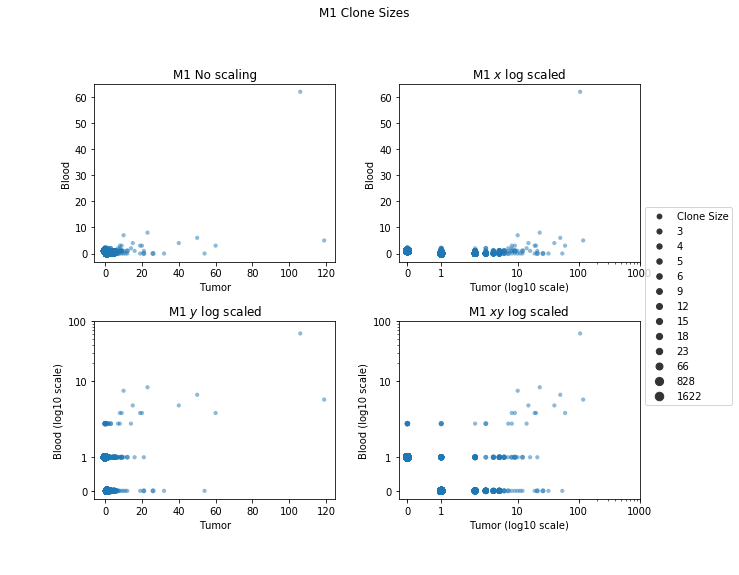

M2


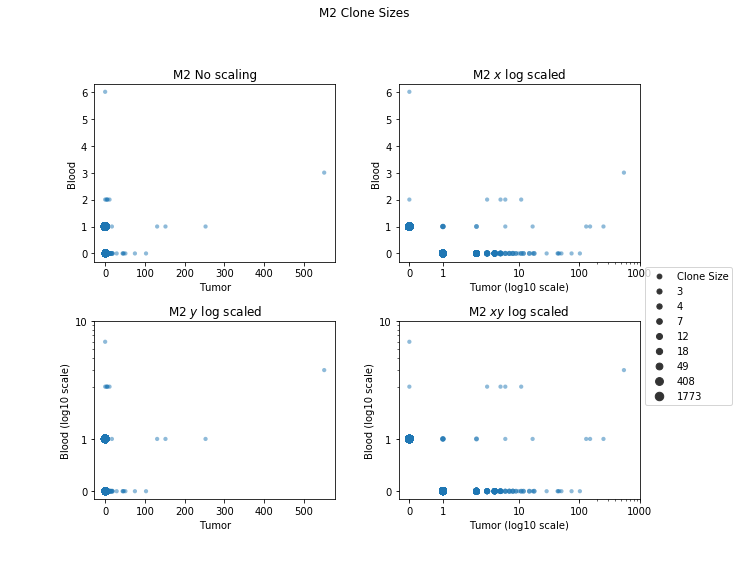

M3


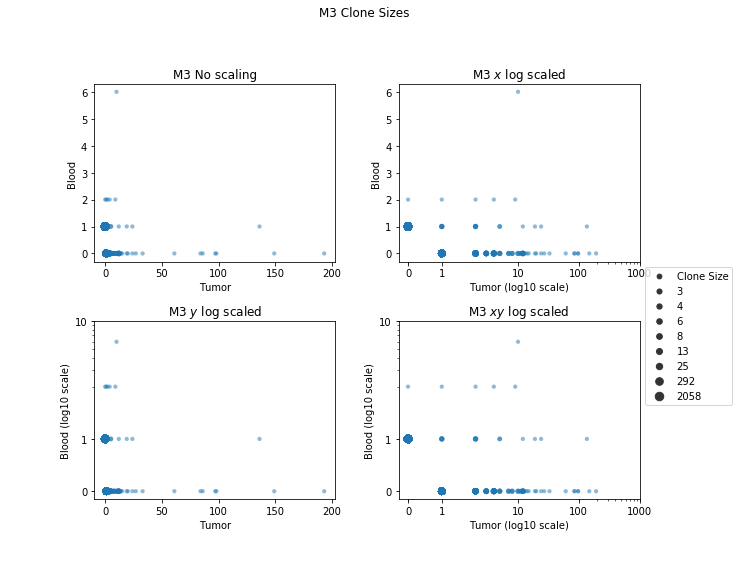

M4


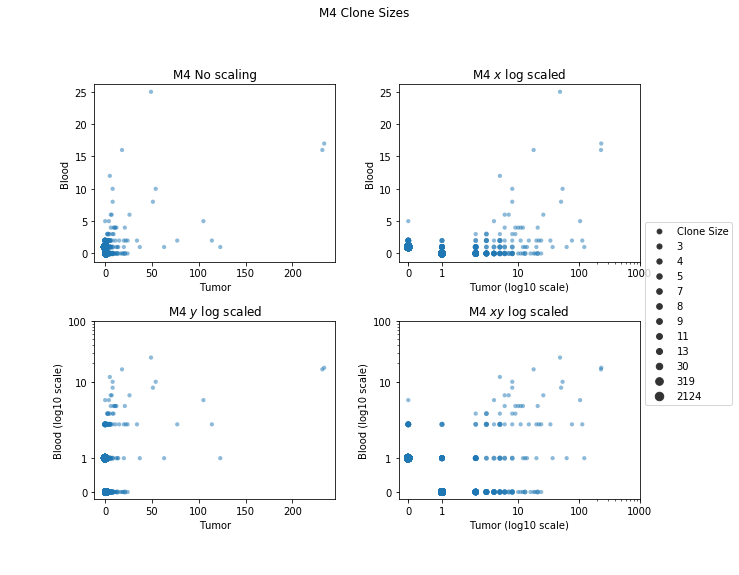

M5


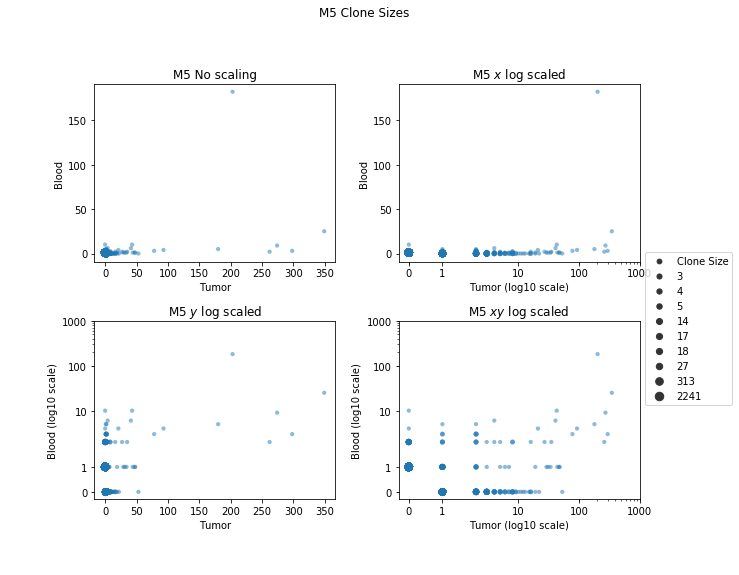

In [164]:
for i,sample in enumerate(samples):
    
    print(sample)
    
    Blood = Blood_meta[i].copy()
    Blood['Sample'].replace(sample + '_Blood', sample, inplace = True)
    
    Tumor = Tumor_meta[i].copy()
    Tumor['Sample'].replace(sample + '_Tumor', sample, inplace = True)
    
    fig, ax = CountTCRs(Blood, Tumor, sample)
    
    if sample == 'M1':
        extent = ax[1,1].get_window_extent().transformed(fig.dpi_scale_trans.inverted())
        fig.savefig('Figures/Fig3D_M1_CloneSizePlot.pdf', bbox_inches=extent.expanded(1.75, 2.75))
        
    if sample in ['M4','M5']:
        extent = ax[1,1].get_window_extent().transformed(fig.dpi_scale_trans.inverted())
        fig.savefig('Figures/SuppFig3A_' + sample + '_CloneSizePlot.pdf', bbox_inches=extent.expanded(1.75, 2.75))
        

# Signature Analysis

### Make a Signature Analysis Object

In [166]:
def SigAlObject(blood_mtx, blood_meta, tumor_mtx, tumor_meta, gene_list, score_name, scale_sd=False):
    
    # Keep only AB clones in metadata
    blood_meta = AB_Clones(blood_meta)
    tumor_meta = AB_Clones(tumor_meta)
    
    # Keep only AB clones in count matrices
    blood_mtx = blood_mtx.loc[blood_meta.index]
    tumor_mtx = tumor_mtx.loc[tumor_meta.index]
    
    # Add the tissue type to each metadata object
    blood_meta['Tissue'] = 'Blood'
    tumor_meta['Tissue'] = 'Tumor'
    
    # Convert to adata objects
    Blood_adata = df_to_adata(blood_mtx,blood_meta)
    Tumor_adata = df_to_adata(tumor_mtx,tumor_meta)
    
    # Combine into a single Adata structure
    Adata = Blood_adata.concatenate(Tumor_adata, join = 'outer')
    Adata.X = np.nan_to_num(Adata.X)
    
    # Normaliziation
    sc.pp.normalize_total(Adata, target_sum = 1e4)
    sc.pp.log1p(Adata)
    
    # If scale to unit variance AND zero mean:
    if scale_sd:
        sc.pp.scale(Adata)
        
    else:   
        # If only zero mean:
        Adata.X = Adata.X - np.mean(Adata.X, axis = 0)
    
    
    # Calculate gene score    
    gene_list = set(gene_list) & set(Adata.var_names)
    sc.tl.score_genes(Adata, gene_list, score_name = score_name)
    
    # Extract metadata
    df = Adata.obs
    
    
    # Extract metadata
    blood_meta = df[ df['Tissue'] == 'Blood' ]
    tumor_meta = df[ df['Tissue'] == 'Tumor' ]
    
    return blood_meta, tumor_meta

    # Extract count matrices
    blood_mtxs = Adata.X[0:len(blood_meta),:]
    tumor_mtxs = Adata.X[len(blood_meta):,:]
    
    # Turn count matrices into pandas dataframes
    blood_mtxs = pd.DataFrame(data = blood_mtxs, index = blood_meta.index, columns = Adata.var_names)
    tumor_mtxs = pd.DataFrame(data = tumor_mtxs, index = tumor_meta.index, columns = Adata.var_names)
    
    return blood_meta, blood_mtxs, tumor_meta, tumor_mtxs
    

### Find scores for gene lists

In [167]:
def gene_scores(blood_meta, tumor_meta, score_name):
    
    UniqueTCRs = list(set(blood_meta['TCR']) & set(tumor_meta['TCR']))
    UniqueTCRs = sorted(UniqueTCRs)
    
    blood_dict = {}
    tumor_dict = {}  
    
    # For each TCR, extract the set of cells with that TCR and calculate the mean gene score.
    # Add to the respective dictionary
    for TCR in UniqueTCRs:
        data = blood_meta[ blood_meta['TCR'] == TCR ].copy()
        blood_dict[TCR] = np.mean(data[score_name])

        data = tumor_meta[ tumor_meta['TCR'] == TCR ].copy()
        tumor_dict[TCR] = np.mean(data[score_name])  
        
    col_names = ['TCR', score_name, 'Tissue']

    # DataFrame for the blood T cells
    blood_df = pd.DataFrame(columns = col_names)
    blood_df['TCR'] = list(blood_dict.keys())
    blood_df[score_name] = list(blood_dict.values())
    blood_df['Tissue'] = 'Blood'

    # DataFrame for the tumor T cells
    tumor_df = pd.DataFrame(columns = col_names)
    tumor_df['TCR'] = list(tumor_dict.keys())
    tumor_df[score_name] = list(tumor_dict.values())
    tumor_df['Tissue'] = 'Tumor'

    blood_df.index = ['TCR_'+str(t) for t in range(len(blood_df))]
    tumor_df.index = ['TCR_'+str(t) for t in range(len(tumor_df))]   
    
    return blood_df,tumor_df

In [168]:
def MakeNM(j):
    
    # If j is odd, subtract 1 to make it even
    if j %2 != 0:
        n = (j - 1)//2
        
    else:
        n = j//2

    m = j % 2
    
    return n,m

In [169]:
gene_lists = [progenitorexh,effector_like,terminallyexh,proliferating,kaech_naive]
gene_names = ['Progenitor Exh', 'Effector-like', 'Terminally Exh', 'Proliferating', 'Kaech (Naive)']


Sample M1



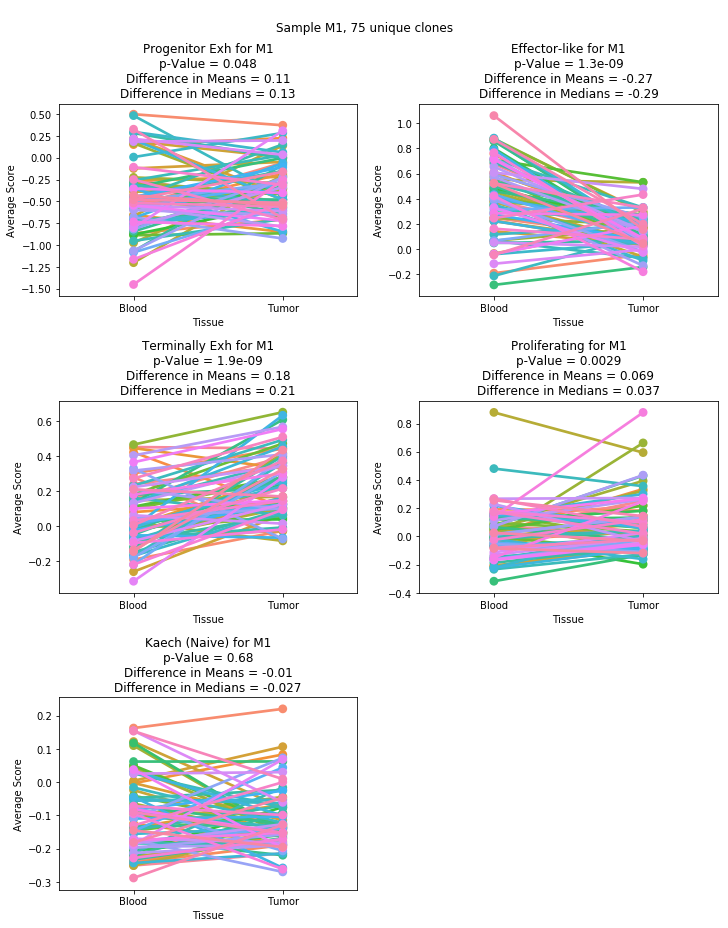


Sample M2



<Figure size 432x288 with 0 Axes>

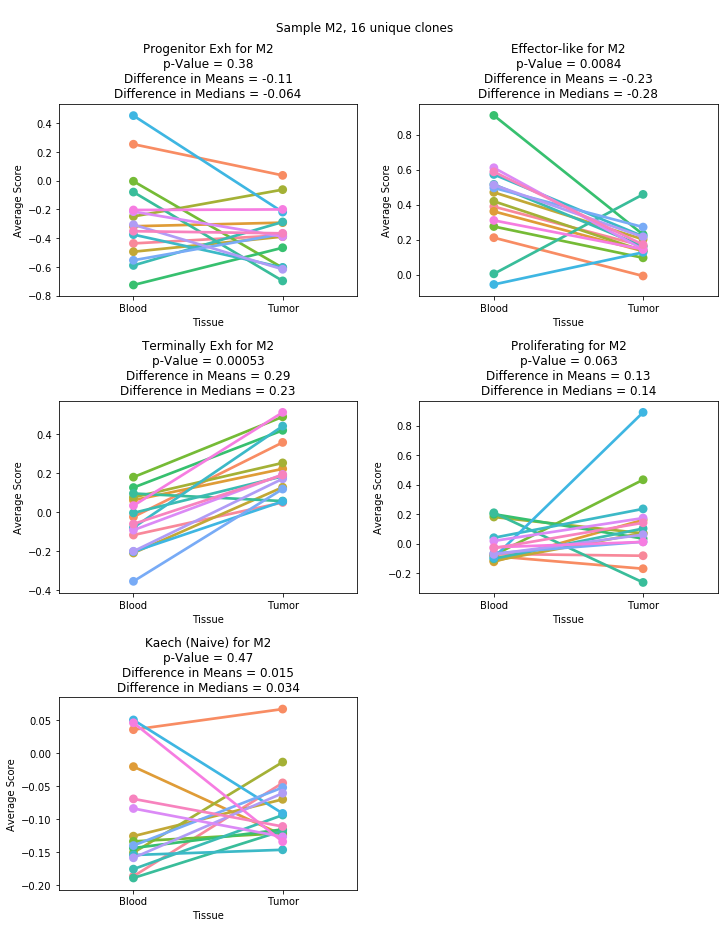


Sample M3



<Figure size 432x288 with 0 Axes>

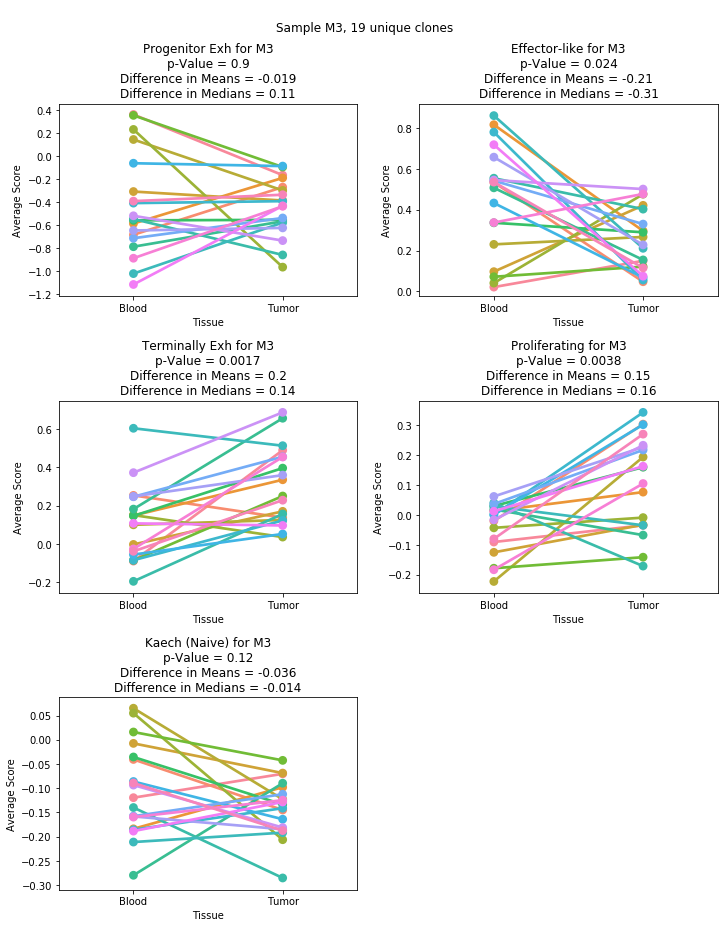


Sample M4



Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


<Figure size 432x288 with 0 Axes>

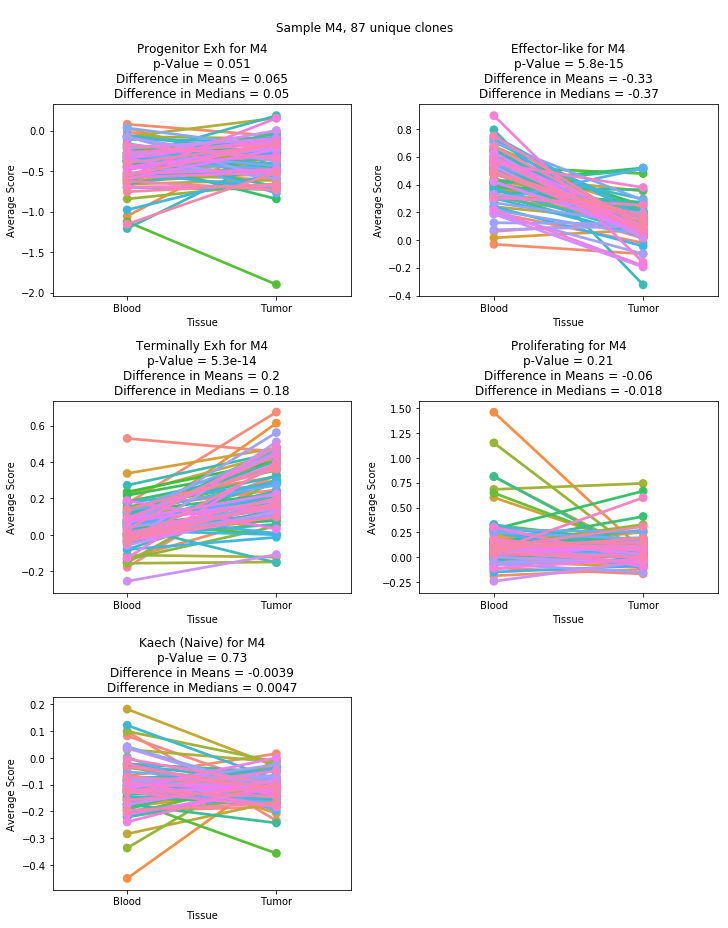


Sample M5



Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


<Figure size 432x288 with 0 Axes>

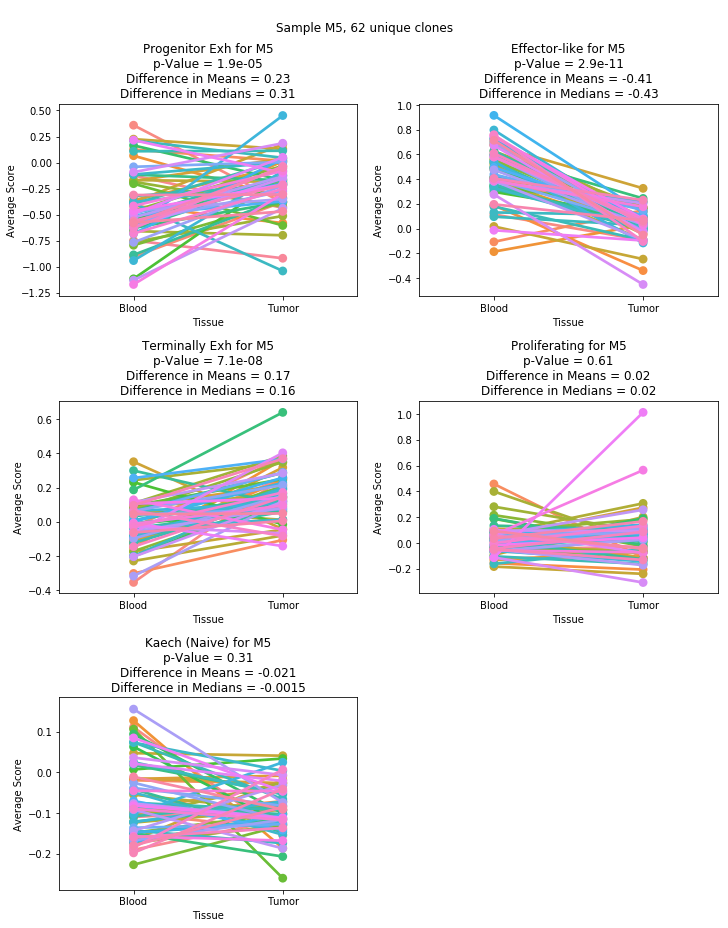

<Figure size 432x288 with 0 Axes>

In [171]:
for i,sample in enumerate(samples):
    
    print("\nSample {}\n".format(sample))
    
    fig, axes = plt.subplots(nrows=3,ncols=2, constrained_layout=True, figsize=(10,13))
    fig.delaxes(axes[2,1])
    

    for j, (genelist,score_name) in enumerate(zip(gene_lists,gene_names)):

        blood_meta, tumor_meta = SigAlObject(
            Blood_mtxs[i], Blood_meta[i], Tumor_mtxs[i], Tumor_meta[i], genelist, score_name, scale_sd = True)
        
        
        blood_df, tumor_df = gene_scores(blood_meta, tumor_meta, score_name)

        # Calculate p-value       
        # Calculate the Wilcoxon signed-rank test.
        # The Wilcoxon signed-rank test tests the null hypothesis that two related
        # paired samples come from the same distribution. In particular, it tests
        # whether the distribution of the differences x - y is symmetric about zero.
        # It is a non-parametric version of the paired T-test.
        
        stat,pval = scipy.stats.wilcoxon(blood_df[score_name],tumor_df[score_name])
        
        # Calculate difference in means
        mean_tumor = np.mean(tumor_df[score_name])
        mean_blood = np.mean(blood_df[score_name])
        diff_mean = mean_tumor - mean_blood
        
        # Calculate difference in medians
        median_tumor = np.median(tumor_df[score_name])
        median_blood = np.median(blood_df[score_name])
        diff_median = median_tumor - median_blood

        # Concatenate the dataframes for easy plotting with the Seaborn package (loaded as 'sns')
        Sample = pd.concat([blood_df,tumor_df])
        
        # Determine the value of n,m from the value of j
        n,m = MakeNM(j)
            
        # Make the plot
        sns.pointplot(data = Sample,  x = "Tissue", y = score_name, hue = "TCR", ax=axes[n,m])
        axes[n,m].set_ylabel('Average Score')
        axes[n,m].legend_.remove()
        
        title1 = "{} for {}".format(score_name,sample)
        title2 = "p-Value = %.2g" % pval
        title3 = "Difference in Means = %.2g" % diff_mean
        title4 = "Difference in Medians = %.2g" % diff_median
        title = title1 + "\n" + title2 + "\n" + title3 + "\n" + title4
        axes[n,m].set_title(title)        
        
    fig.suptitle("\nSample {}, {} unique clones\n".format(sample, len(blood_df)))

    if sample == 'M1':
        plt.savefig('Figures/Fig3E_M1_SignaturePointPlots.pdf')
        
    if sample == 'M2':
        plt.savefig('Figures/SuppFig2E_M2_SignaturePointPlots.pdf')
        
    if sample == 'M3':
        plt.savefig('Figures/SuppFig2E_M3_SignaturePointPlots.pdf')
    
        
    plt.show()
    plt.tight_layout()

# Create a function to find DE genes

In [177]:
def RankGenesGroupsPairwise(Adata, groupby, method = 'wilcoxon', save_name = None):
    """
    Function to find DE genes between groups.
    
    Inputs
    ------
    Adata: A single anndata object.
    groupby (string): The Adata.obs variable to make comparisons between.
    method (string): Statistical test to run (t-test, wilcoxon, etc).
    filename (string): If filename given, then save each DE gene list to an Excel file.
        
    Outputs
    -------
    Saves DE gene lists to an Excel file (optional).
    """
    
    # From the Adata object, define the unique groups in the 'groupby' column
    groups = list(Adata.obs[groupby].unique())
    
    # If the sample size is fewer than 2 cells, remove the group from the Adata object
    for group in groups:
        if len(Adata[ Adata.obs[ groupby ].isin([group]) ]) < 2:
            Adata = Adata[ ~ Adata.obs[ groupby ].isin([group]) ]

    groups = list(Adata.obs[groupby].unique())
    
    
    # Define dictionary keys, to be used later
    old_keys = ['names', 'pvals_adj', 'pvals', 'logfoldchanges', 'scores']
    new_keys = ['Gene Names', 'Adj pvals', 'Pvals', 'Log2FC', 'Scores']
    
    # Create an emtpy dictionary, DEgenes, to store the results
    DEgenes = {}
    
    # For each group in groups, make the group a reference
    for ref in groups:
        print('The reference group is {}\n'.format(ref))
    
        # Find the DE genes, put them in the Adata object
        sc.tl.rank_genes_groups(Adata, groupby = groupby, groups = groups, reference = ref, method = method,
                                n_genes = len(Adata.var_names) , use_raw=False)

        # Plot the DE genes (if not using GSEA pipeline)
        sc.pl.rank_genes_groups(Adata, n_genes = 20)
    
        # Extract the DE genes and statistics from the Adata object
        results = Adata.uns['rank_genes_groups']
        
        # s_groups (sample groups) are the names of the groups in which DE genes are upregulated
        s_groups = results['names'].dtype.names
        
        
        # For each sample in the comparison,
        for sample in s_groups:
            
            # Create an emtpy pandas dataframe
            df = pd.DataFrame(columns = new_keys)

            # Load the data from the results object to the dataframe
            for new_key,old_key in zip(new_keys,old_keys):
                df[new_key] = results[old_key][sample]
            
            # Keep genes that are significant
            df = df[ df['Adj pvals'] < 0.05 ]
            
            # Sort
            df['Rank1'] = df['Adj pvals'].rank(ascending=False)
            df['Rank2'] = df['Log2FC'].rank()
            df['Avg_Rank'] = (df['Rank1'] + df['Rank2'])/2
            df = df.sort_values(by = 'Avg_Rank', ascending=False)
            
            df = df[ df['Log2FC'] > 0 ]
            df = df.drop(columns = ['Rank1', 'Rank2', 'Avg_Rank'])
            
            # Save the dataframe into the DEgenes object
            DEgenes[sample + ' vs. ' + ref] = df
            
    # If save_name is given, save results to an Excel file
    if save_name is not None:
        
        with pd.ExcelWriter(save_name) as writer:

            # For each key,
            for key in DEgenes.keys():

                # Extract the pandas dataframe, save it to an Excel sheet
                df = DEgenes[key]
                df.to_excel(writer, sheet_name = key)
        
        
    return DEgenes

### Run on Integrated Mouse Blood - Matching vs. Non-Matching

... storing 'Matching' as categorical
... storing 'Sample' as categorical
... storing 'TCR' as categorical
... storing 'Matching_pre_filter' as categorical


The reference group is not_matching



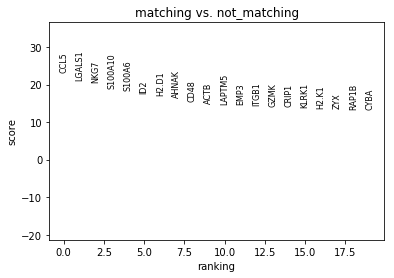

The reference group is matching



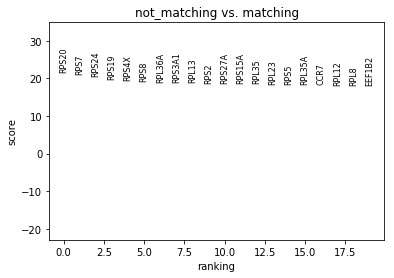

In [179]:
Meta = AB_Clones(MouseIntBlood_meta)
Meta = Meta.replace(['M1_matching', 'M2_matching', 'M3_matching'], 'matching')

Mtxs = MouseIntBlood_mtxs.loc[Meta.index]

Adata = df_to_adata(Mtxs, Meta)

DEgenes = RankGenesGroupsPairwise(Adata, groupby = 'Matching', method = 'wilcoxon',
                                  save_name = 'Outputs/TableS2_DEgenes_TM_vs_nTM.xlsx')

# Pseudo-Bulk Analysis

### Recrate AB_Clones function to work with Adata objects

In [182]:
def AB_Clones_adata(Adata, non_AB=False):
    """
    This function takes an Adata object and returns all the cells that have at least one alpha and
    one beta chain.
    
    The 'non_AB' option (Boolean) asks the user to specify if they want to return the non-AB cells as well.
    Default is False, meaning that only the AB cells will be returned.
    """
    
    # Adata object with AB clones
    Adata_AB = Adata[ ~ Adata.obs['Matching'].isin(['notcr','alpha_chain_only','beta_chain_only']) ]
    
    # Adata object with non-AB clones
    Adata_non_AB = Adata[ Adata.obs['Matching'].isin(['notcr','alpha_chain_only','beta_chain_only']) ]
    
    # Remove the unused categories
    Adata_AB.obs['Matching'].cat.remove_unused_categories(inplace=True)
    Adata_non_AB.obs['Matching'].cat.remove_unused_categories(inplace=True)
    
    # If user asks to return the non-AB clones, return both
    if non_AB:
        return Adata_AB, Adata_non_AB
    
    # Otherwise, return just the AB clones
    else:
        return Adata_AB

### Create Function to Get Pseudo-Bulk Data

In [77]:
def PseudoBulkAnalysis():

    # Initialize tissue and matching setting
    Tumor = df_to_adata(MouseIntTumor_mtxs, MouseIntTumor_meta)
    Blood = df_to_adata(MouseIntBlood_mtxs, MouseIntBlood_meta)
    
    Adatas = [Tumor, Blood]
    m = ['M1_matching', 'M2_matching', 'M3_matching']


    # Make list of union of genes
    all_genes = list(set(Adatas[0].var_names) | set(Adatas[1].var_names))
    
    Matrices = [0,0]

    # Loop over Adata objects, one for tumor and one for blood
    for i,Adata in enumerate(Adatas):

        # Copy the adata object
        Adata = Adatas[i].copy()

        # Keep only the matching cells
        Adata = Adata[ Adata.obs['Matching'].isin(m) ]
        
        # Label all matching cells as 'matching
        Adata.obs['Matching'].replace(m, 'matching', inplace = True)

        # Get all the TCRs
        TCRs = list(Adata.obs['TCR'].unique())
        T = len(TCRs)

        # Initialize matrix, one row for each TCR/clone, and one column for each gene
        matrix = np.zeros([len(TCRs), len(all_genes)], int)

        # For each TCR,
        for j,TCR in enumerate(sorted(TCRs)):
            if j == int(T/2):
                print('Halfway through TCRs')
            
            # Subset Adata to keep all cells in the same clone
            data = Adata[ Adata.obs['TCR'].isin([TCR]) ]

            # For each gene,
            for k,gene in enumerate(all_genes):

                # If the gene is in the Adata object,
                if gene in list(data.var_names):
                    #print(gene)

                    # Get the average count
                    matrix[j,k] = data[:, gene].X.sum()

                else:
                    matrix[j,k] = 0

        Matrices[i] = matrix

    return Matrices

### Get Output, Prepare for EdgeR

In [78]:
# Get the matrices
# This analysis takes quite some time
Matrices = PseudoBulkAnalysis()

In [188]:
# Make Adata objects
MouseIntTumor = df_to_adata(MouseIntTumor_mtxs, MouseIntTumor_meta)
MouseIntBlood = df_to_adata(MouseIntBlood_mtxs, MouseIntBlood_meta)

MouseIntTumor.obs['Matching'] = MouseIntTumor.obs['Matching'].astype('category')
MouseIntBlood.obs['Matching'] = MouseIntBlood.obs['Matching'].astype('category')

In [80]:
# Set up the matrices so that we can properly use it in EdgeR to find DE Genes
# First get a list of all the matching TCRs (remove non-matching TCRs)
Adata = AB_Clones_adata(MouseIntBlood).copy()
Adata = Adata[ Adata.obs['Matching'] != 'not_matching' ]
TCRs = sorted(list(Adata.obs['TCR'].unique()))

# Make list of genes
all_genes = list(set(MouseIntTumor.var_names) | set(MouseIntBlood.var_names))

In [81]:
# Make a list of tumor and blood clones to label each clone
all_clones = ['Clone_{}_Tumor'.format(i) for i in range(len(TCRs))]
all_clones.extend(['Clone_{}_Blood'.format(i) for i in range(len(TCRs))])

In [82]:
# Put the PseudoBulk data into a dataframe and save to disk, then load into EdgeR
PseudoBulk = pd.DataFrame(index = all_clones, columns = all_genes, data = np.concatenate(Matrices))
PseudoBulk.to_csv('Outputs/MousePseudoBulk_forEdgeR.csv')

### Read outputs from EdgeR

In [ ]:
# Get results from R
DEgenes = pd.read_csv('Outputs/MousePseudoBulk_DEgenes_unsorted.csv', index_col = 0)

# Sort DE genes
DEgenes['Rank1'] = DEgenes['FDR'].rank(ascending=False)
DEgenes['Rank2'] = DEgenes['logFC'].rank()
DEgenes['Avg_Rank'] = (DEgenes['Rank1'] + DEgenes['Rank2'])/2
DEgenes = DEgenes.sort_values(by = 'Avg_Rank', ascending=False)
DEgenes = DEgenes.drop(columns = ['Rank1', 'Rank2', 'Avg_Rank'])

In [ ]:
# Genes upregulated in tumor have positive logfoldchange
# Genes upregulated in blood have negative logfoldchange
DEG_tumor = DEgenes[ DEgenes['logFC'] > 0 ]
DEG_blood = DEgenes[ DEgenes['logFC'] < 0 ]

# Save as Python dictionary
DEgenes = {}
DEgenes['Up_in_tumor'] = DEG_tumor
DEgenes['Up_in_blood'] = DEG_blood

In [ ]:
# Save as Excel file
with pd.ExcelWriter('Outputs/MousePseudoBulk_DEgenes_sorted.xlsx') as writer:

    # For each key,
    for key in DEgenes.keys():

        # Extract the pandas dataframe, save it to an Excel sheet
        df = DEgenes[key]
        df.to_excel(writer, sheet_name = key)

# Dotplots

### Create a Helper Function

In [190]:
def IntersectionOfGenes(object1, object2, sort = False, upper = False):
    """
    This function returns the genes in the intersection of two objects. If the object is an Adata object,
    then the gene names are used (Adata.var_names). Otherwise, the function expects a set or a list of genes.
    
    This code is NOT optimized for speed - rather, the goal is to return the intersection of genes:
    - in the order of the first list
    - regardless of whether or not either list is upper or lower case
    
    Inputs
    ------
    object1: An Adata object, a list of genes, or a set of genes.
    object2: An Adata object, a list of genes, or a set of genes.
    sort (Bool): Sorts the final output. Default is False (genes will be return in the order of object1)
    upper (Bool): Upper-cases the final output. Default is False (genes will be returned in the original case)
    """
    
    ### Parse the inputs and see if they're lists or Adata objects ###
    
    import anndata
    
    # Initialize an empty object to store the lists
    Lists = [0, 0]
    
    # Loop over each input object
    for i,obj in enumerate([object1, object2]):
        
        # If the object is an Adata object, extract the genes as a list
        if type(obj) == anndata._core.anndata.AnnData:
            Lists[i] = list(obj.var_names)
        
        else:
            # Otherwise,  object is assumed to be a list or set - therefore, turn it into a list.
            Lists[i] = list(obj)
            
            
    # Now we have two gene lists
    list1 = Lists[0]
    list2 = Lists[1]
    
    ### Find the intersection of both lists ###
    
    # Initialize a list of False values
    TrueFalse = [False] * len(list1)
    
    # Make both genes upper case to find the intersection
    List1 = list(map(str.upper, list1))
    List2 = list(map(str.upper, list2))
    
    # For each gene in the first list, if it exists in the second list,
    # then set its truth value to True
    for i,gene in enumerate(List1):
        if gene in List2:
            TrueFalse[i] = True
            
    # Create an object to be returned by doing the following:
    ListToReturn = np.array(list1)             # Turn the original list into a NumPy array
    ListToReturn = ListToReturn[TrueFalse]     # Keep only the genes that are in the intersection
    ListToReturn = list(ListToReturn)          # Return it to a list to to use list methods
          
    # Sort the genes, if specified
    if sort == True:
        ListToReturn.sort()
        
    # Upper case all the genes, if specified
    if upper == True:
        ListToReturn = list(map(str.upper, ListToReturn))
    
    # Return the list
    return ListToReturn

### Create Function to Make Dotplots

In [186]:
def DotPlots(gene_lists, gene_names, save_name):
    
    # Create empty matrix
    mtx = np.zeros([len(gene_lists), 12], dtype = 'float')
    
    # Keep only AB cells from blood and tumor
    Blood = AB_Clones_adata(MouseIntBlood).copy()
    Tumor = AB_Clones_adata(MouseIntTumor).copy()
    
    
    # Join the adata objects
    Adata = anndata.AnnData.concatenate(Blood, Tumor, join = 'outer')
    
    # Fill NaN with 0s
    Adata.X[np.isnan(Adata.X)] = 0
    
    # Combine all matching labels into a single label
    Adata.obs['Matching'].replace(['M1_matching', 'M2_matching', 'M3_matching'], 'matching', inplace = True)
    
    # Add column to metadata, combining 'Sample' and 'Matching'
    Adata.obs['Sample_Matching'] = Adata.obs['Sample'].astype('str') + '_' + Adata.obs['Matching'].astype('str')
    
    # Normalize
    sc.pp.normalize_per_cell(Adata, counts_per_cell_after=1e4)
    sc.pp.log1p(Adata, base=2)
    sc.pp.scale(Adata)
    
    # Initialize empty variables, used only for plotting
    x_list = []
    y_list = []
    Avg_list = []
    sample_list = []
    gene_score_list = []
    
    # Define new samples
    samples = ['M1_Blood_matching', 'M2_Blood_matching', 'M3_Blood_matching',
               'M1_Blood_not_matching', 'M2_Blood_not_matching', 'M3_Blood_not_matching',
               'M1_Tumor_matching', 'M2_Tumor_matching', 'M3_Tumor_matching',
               'M1_Tumor_not_matching', 'M2_Tumor_not_matching', 'M3_Tumor_not_matching']
    
    # Loop over gene lists
    for i,(gene_list,gene_name) in enumerate(zip(gene_lists,gene_names)):
        
        genes_to_plot = IntersectionOfGenes(Adata, gene_list)
        sc.tl.score_genes(Adata, gene_list = genes_to_plot, score_name = gene_name)
        
        # Separate score by sample type
        for j,sample in enumerate(samples):
            
            # Keep all cells for that particular sample
            sample_scores = Adata[ Adata.obs['Sample_Matching'] == sample ].obs
            
            # Take the average gene score, add to mtx
            mtx[i,j] = np.mean(sample_scores[gene_name])
        
        # Update variables for plotting
        x_list.extend([i]*len(samples))
        y_list.extend([i for i in range(len(samples))])

        gene_score_list.extend([gene_names[i]]*len(samples))
        Avg_list.extend(mtx[i, :])
        sample_list.extend(samples)
        
    # Create final matrix to plot
    Mtx = pd.DataFrame(columns = ['x', 'y', 'Avg', 'Sample', 'Gene List'])
    Mtx['x'] = x_list
    Mtx['y'] = y_list
    Mtx['Avg'] = Avg_list
    Mtx['Sample'] = sample_list
    Mtx['Gene List'] = gene_score_list

    plt.figure(figsize=(10,8))

    plt.scatter(Mtx['x'], Mtx['y'], c = Mtx['Avg'], s=200, cmap=plt.cm.get_cmap('RdBu_r'), edgecolor = None)
    plt.ylabel('Sample')
    plt.xlabel('Gene Signature')
    plt.yticks([i for i in range(len(samples))], samples)
    plt.xticks([i for i in range(len(gene_names))], gene_names)
    plt.colorbar()
    plt.title('Average Gene Score per Sample (Integrated Mouse)')
    plt.tight_layout()
    plt.savefig(save_name)
    plt.show()
    
    return None

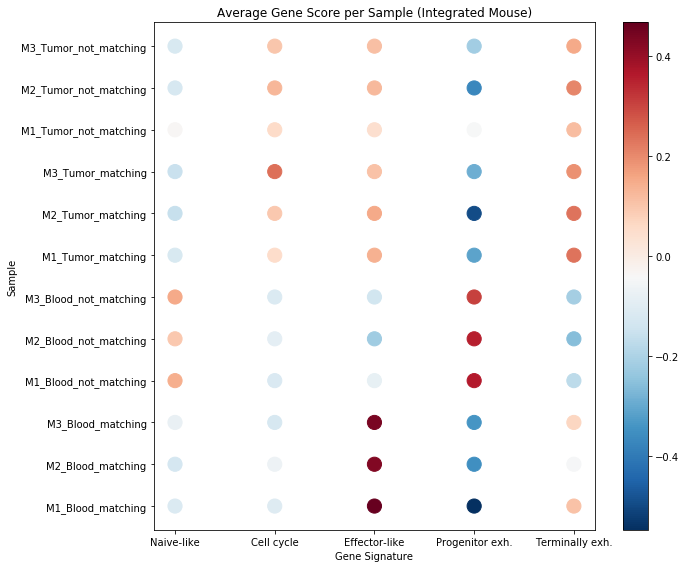

In [191]:
gene_lists = [kaech_naive, cellcycle, effector_like, progenitorexh, terminallyexh]
gene_names = ['Naive-like', 'Cell cycle', 'Effector-like', 'Progenitor exh.', 'Terminally exh.']

DotPlots(gene_lists, gene_names, save_name = 'Figures/SuppFig3C_DotplotIntegratedMouse_log2.pdf')